# 05 compare the different FDG runs / reference regions

versions needed to compare:

Data versions:
original reference region + original subject set
Paracentral-gm reference region + original subject set
Paracentral-gm reference region + new subject set
RAS-ref1 reference region + original subject set
RAS-ref1 reference region + new subject set



age correction of original data is for plasma data only, linear regression using all_data[all_data['source'].isin(['Control']) & all_data['Subject_Label'].isin(['AANDS', 'ADRC'])])

In [1]:
# install required packages - commented out so it doesn't install every time
#%conda install -n Lauren openpyxl numpy pandas statsmodels plotnine matplotlib scikit-learn scipy mizani nbconvert pandoc pyreadstat kmodes seaborn

# import required packages
import openpyxl; 
import datetime;
import numpy as np;
import pandas as pd;
import statsmodels as sm;
import statsmodels.formula.api as smf;
import plotnine as p9;
import matplotlib;
#import sklearn;
import scipy;
from scipy.stats import linregress;
from scipy.stats import pearsonr;
import itertools
from sklearn import preprocessing 
import inspect
import pickle


# read in and clean data

In [2]:
data_folder_loc = "//admsyn/Primary/ADM/CustomerStudies/Rockefeller/Riluzole_Biomarkers/"
code_folder_loc = "//admsyn/homes/@DH-ADMDX/0/lauren.koenig-1606/code/Riluzole FDG/"

In [3]:
# read in data
composite, pons, para, new_para, ras = pd.read_pickle(code_folder_loc + '/output/01_newdata.pkl')

In [4]:
# define biomarker groups
FDG_columns = ['Avg_MedOrbFrontal', 'Graycer_gm', 'Avg_PCC', 'Avg_Hip', 'MTL_gm', 'CO', 'Temp', 'SensMot_gm', 'L_Hip',
 'Vermis_gm', 'FRONTAL_gm', 'AC_gm', 'Precun_gm', 'Par_gm', 'RASref1_gm', 'Temp_gm', 'Paracentral_gm', 'R_Hip', 'PostCing_gm']

plasma_columns = [ 'Ab40', 'Ab42', 'Ab42_40', 'GFAP','NFL',  'pTau181', 'pTau217',  'pTau231', 'pTau181_Ab42']
log10_plasma_columns = [s + '_log10' for s in plasma_columns]

cog_columns = ['MMSE', 'adascogtotal', 'bvrt', 'dstotal','tma','tmb',  'cowattotal', 'cdrtotal', 'cdrsum', 'adltotal', 'npitotal', 'gds']
vol_columns = ['VOL_Precun_Lz', 'VOL_Precun_Rz', 'VOL_InfPar_Lz', 'VOL_InfPar_Rz', 'VOL_Hip_Lz', 'VOL_Hip_Rz', 'VOL_TotalGrayz', 'VOL_Inf_Mid_Fus_Temp_Lz', 
'VOL_Inf_Mid_Fus_Temp_Rz','VOL__MidFront_Lz', 'VOL_MidFront_Rz']



# composite and para: (0.68-0.85 correlation) 

correlation for Avg_PCC is 0.75 with p-value of 0.0


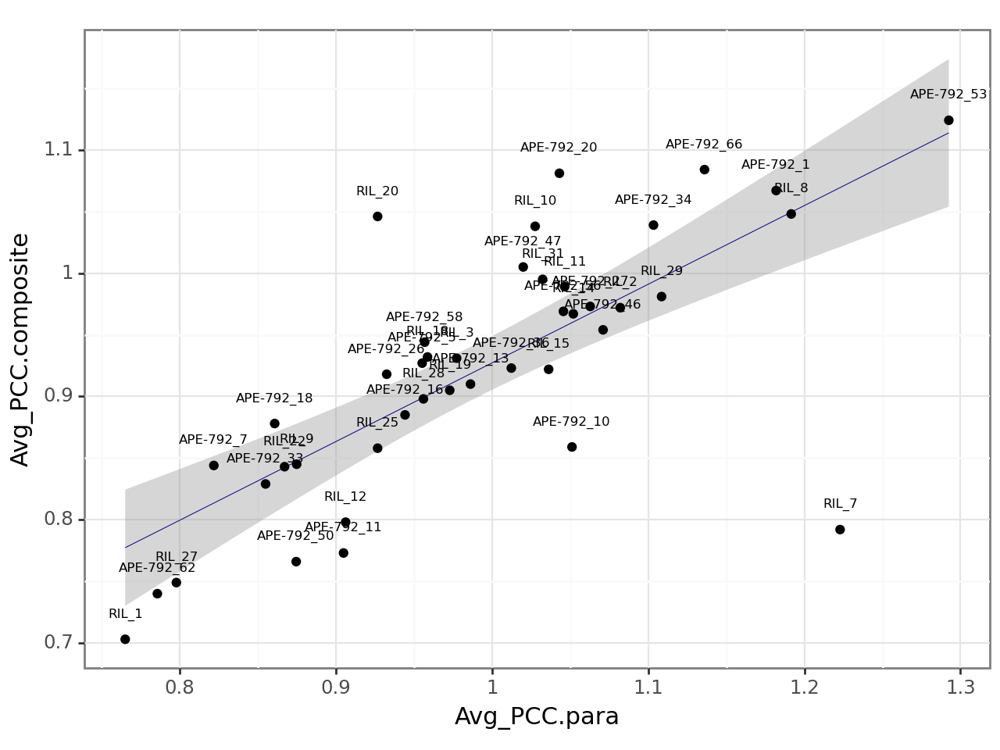


correlation for MTL_gm is 0.85 with p-value of 0.0


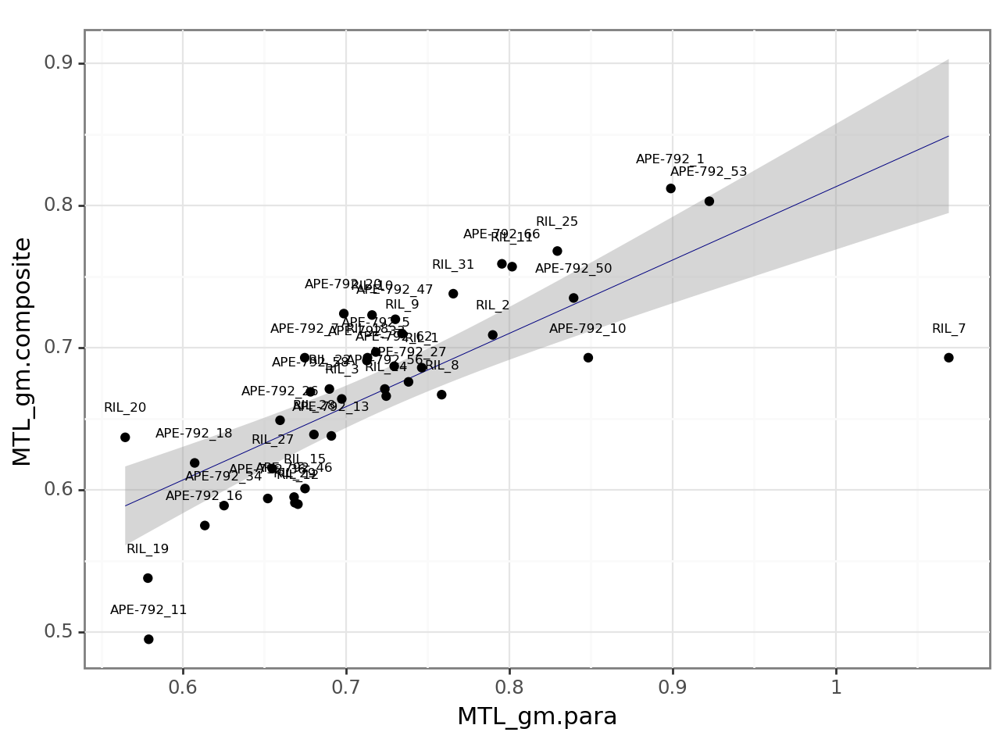


correlation for AC_gm is 0.83 with p-value of 0.0


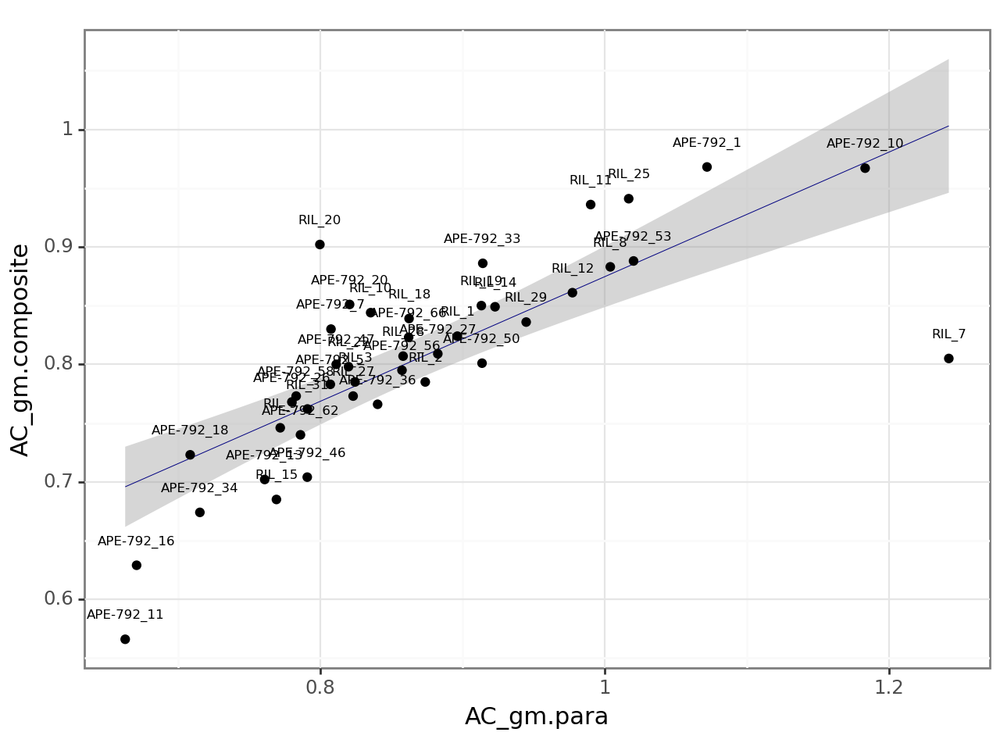


correlation for Precun_gm is 0.68 with p-value of 0.0


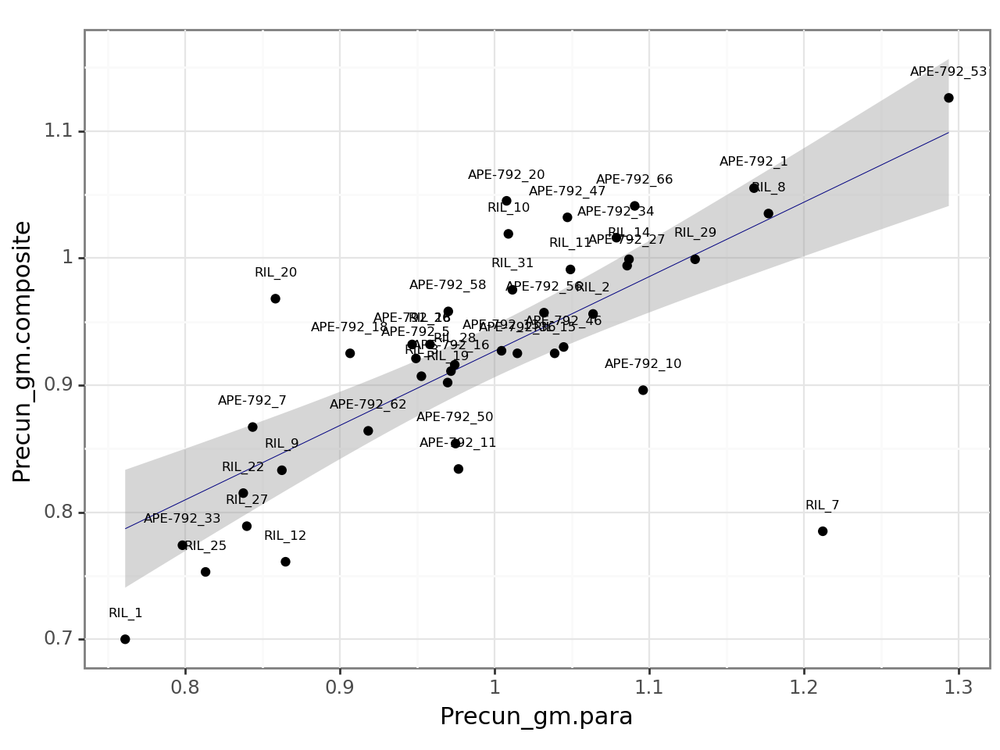


correlation for Par_gm is 0.81 with p-value of 0.0


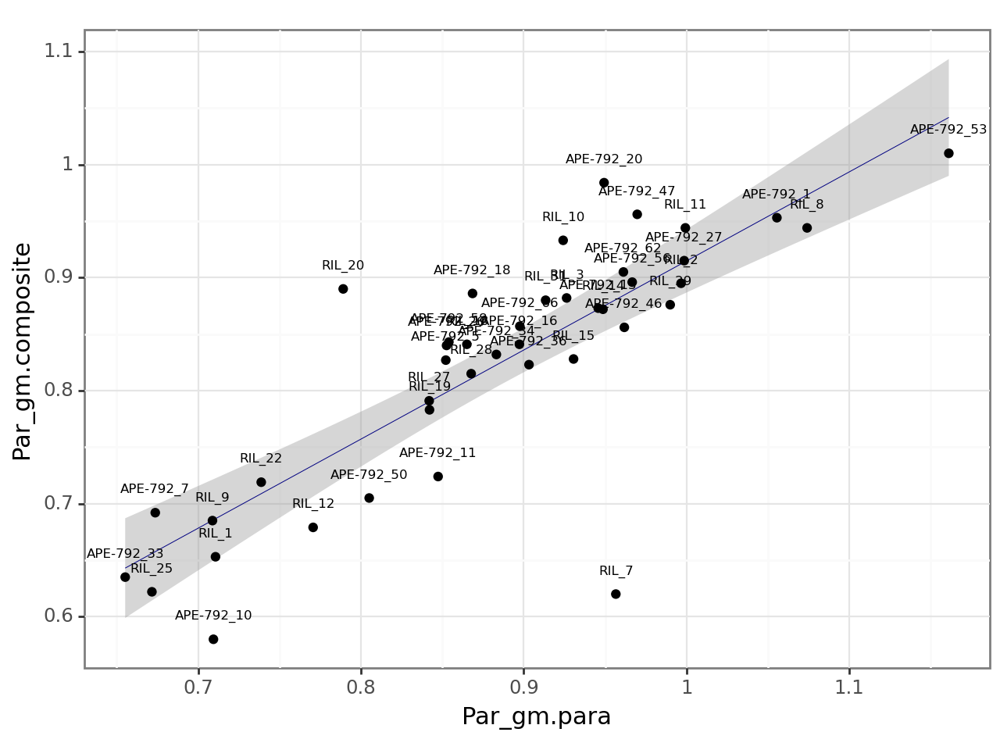


correlation for Temp_gm is 0.76 with p-value of 0.0


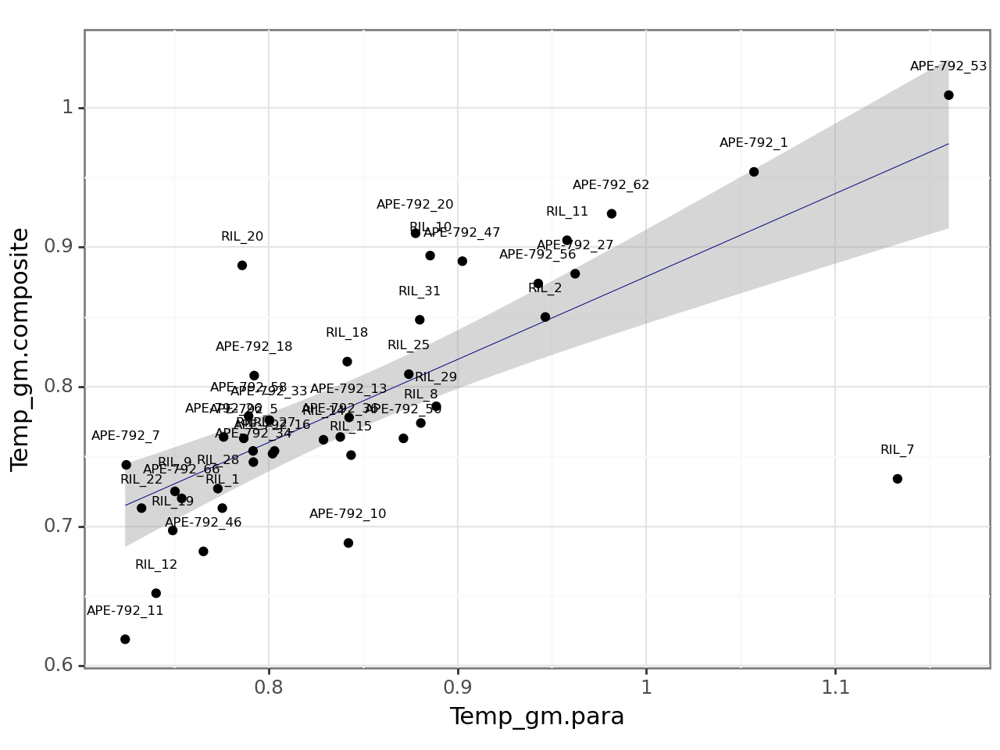


correlation for PostCing_gm is 0.77 with p-value of 0.0


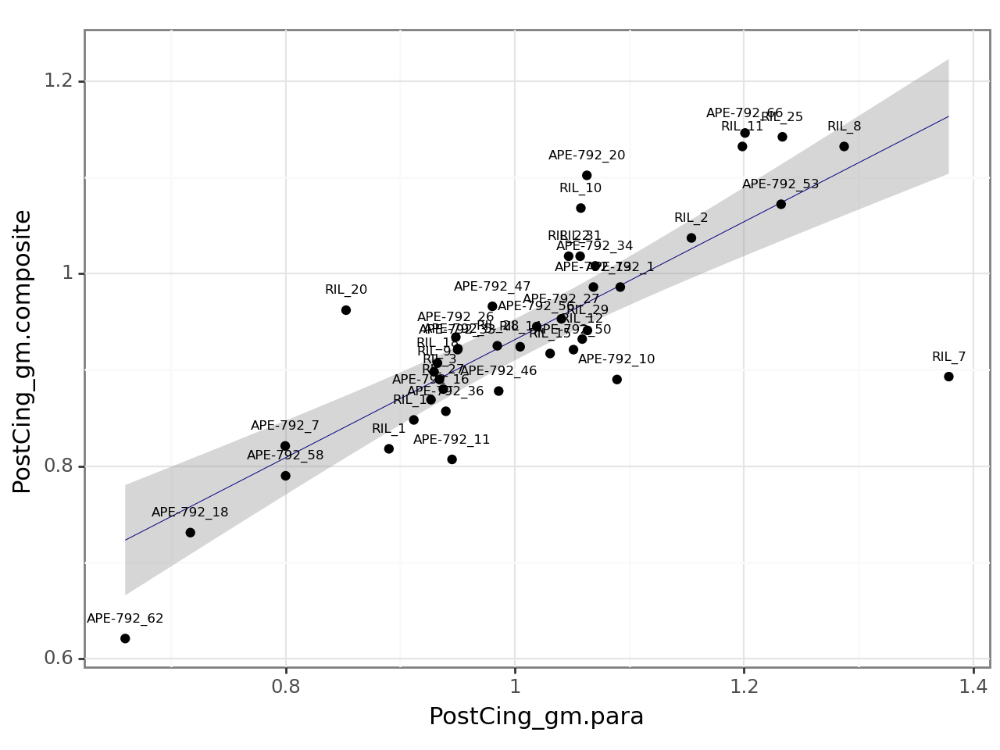

In [5]:
for var in [ele for ele in FDG_columns if (ele in para.columns) & (ele in composite.columns)]:
    temp1 = para.loc[para['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp2 = composite.loc[composite['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp_combined = pd.merge(temp1, temp2, how = 'outer', on = ['ID_ADM'], suffixes=('.para', '.composite'))
    temp_combined = temp_combined.dropna()
    stat, pval = scipy.stats.spearmanr(temp_combined[var +'.para'], temp_combined[var +'.composite'])
    print('correlation for', var, 'is', stat.round(2), 'with p-value of', pval.round(4))    

    print(p9.ggplot(temp_combined, p9.aes(x = var +'.para', y = var +'.composite', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02))

# composite and pons (0.33-0.61 correlation)

correlation for MTL_gm is 0.35 with p-value of 0.0238


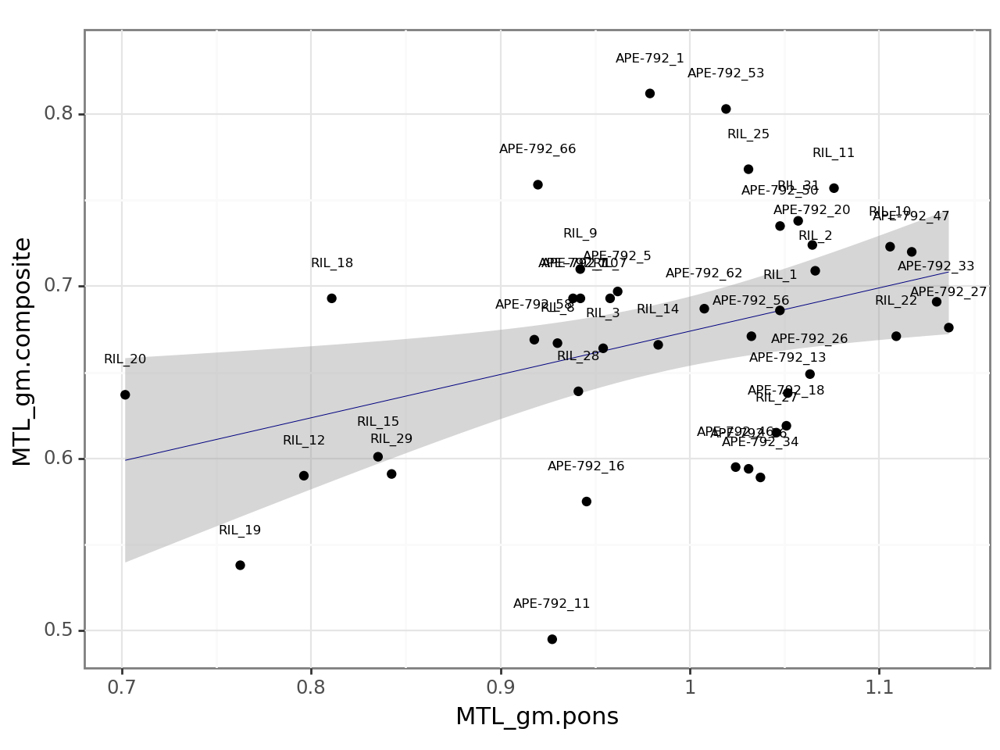


correlation for AC_gm is 0.33 with p-value of 0.0302


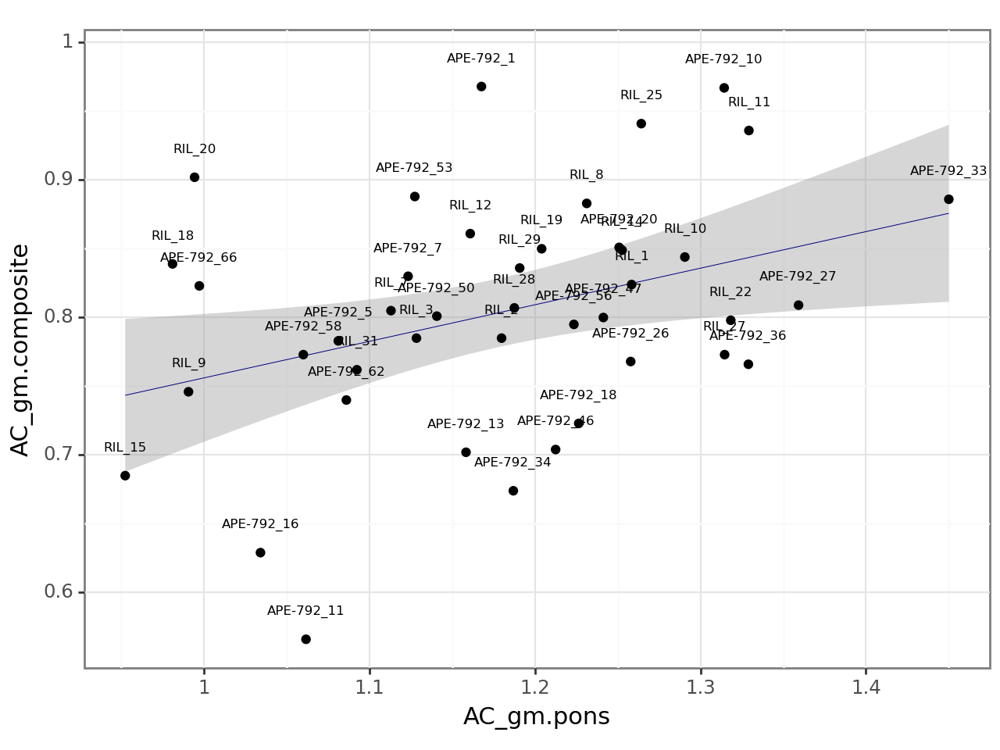


correlation for Precun_gm is 0.52 with p-value of 0.0004


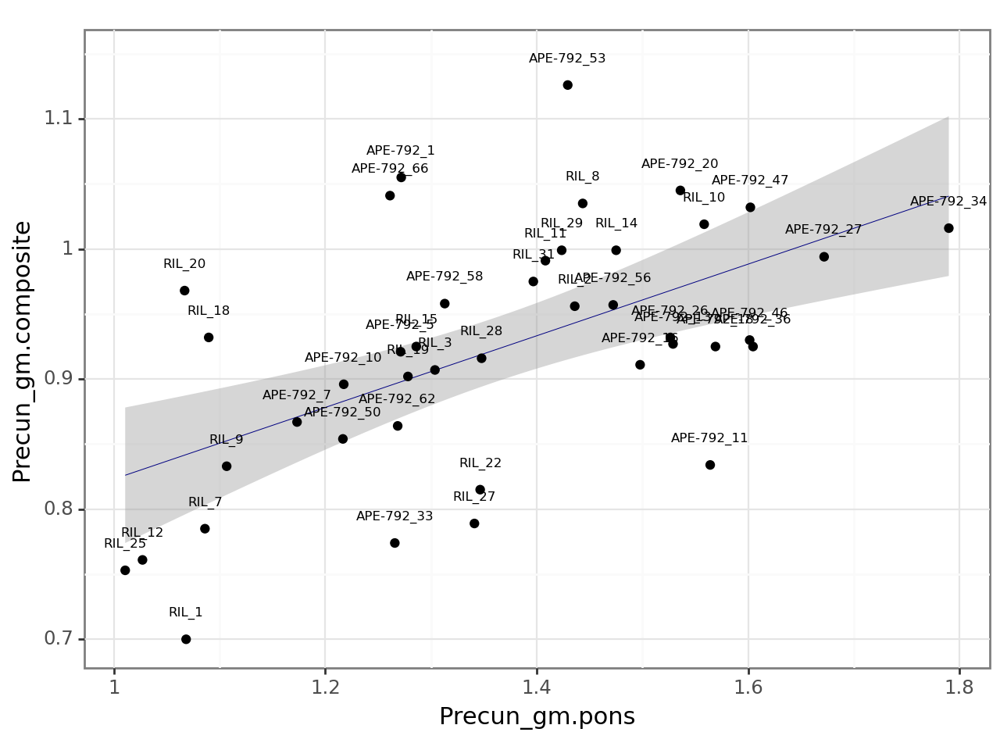


correlation for Par_gm is 0.61 with p-value of 0.0


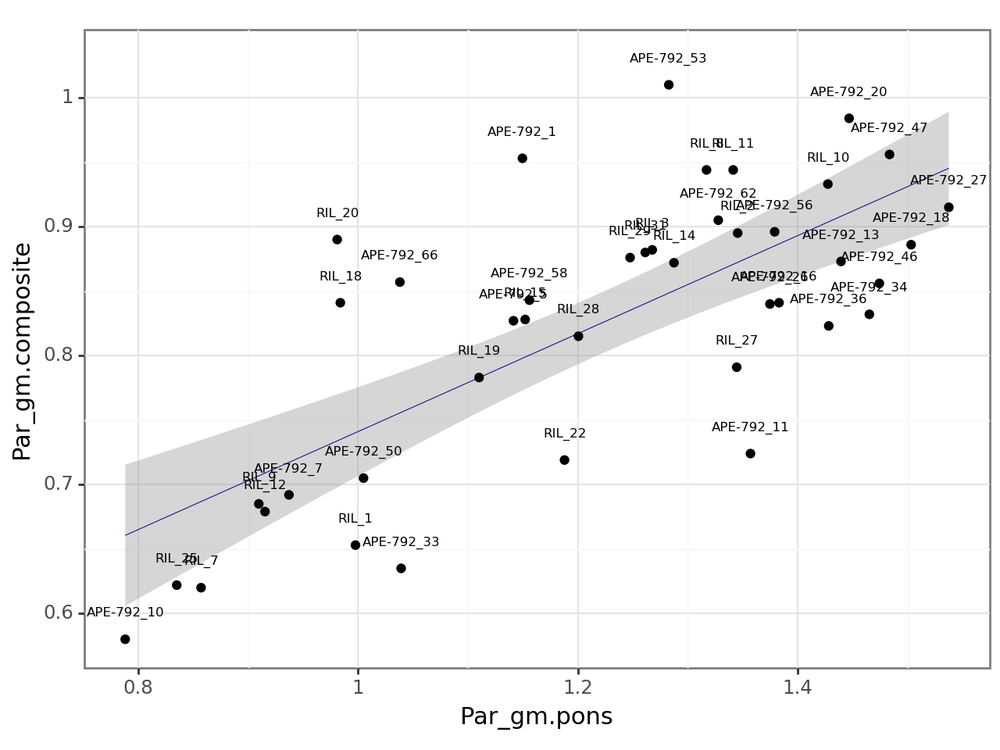


correlation for Temp_gm is 0.56 with p-value of 0.0001


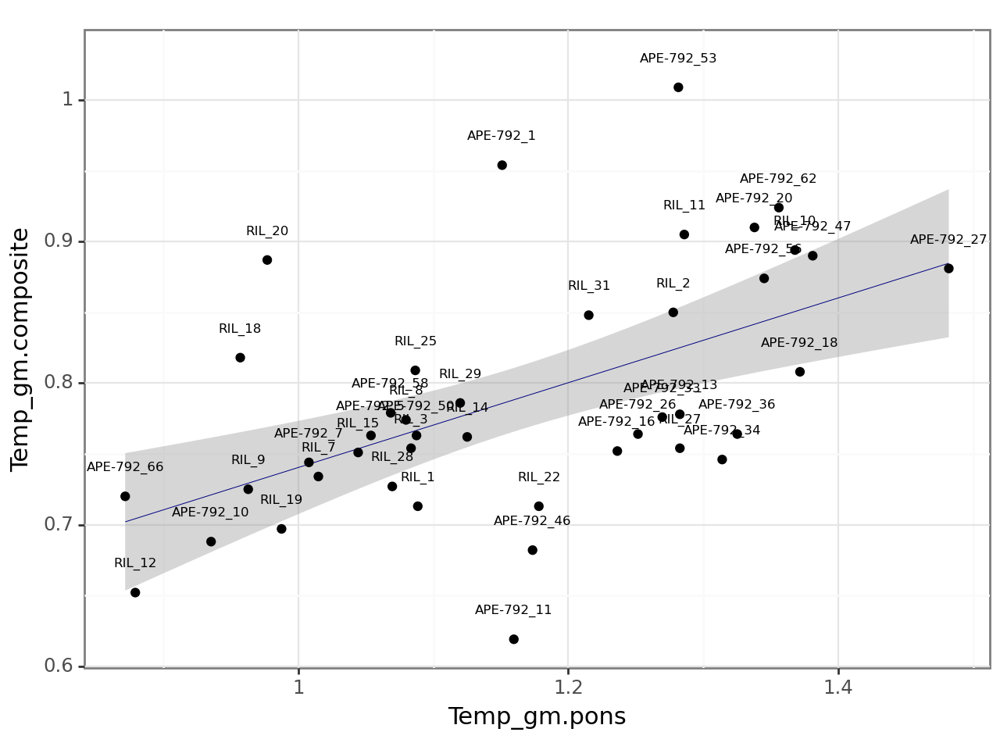


correlation for PostCing_gm is 0.58 with p-value of 0.0001


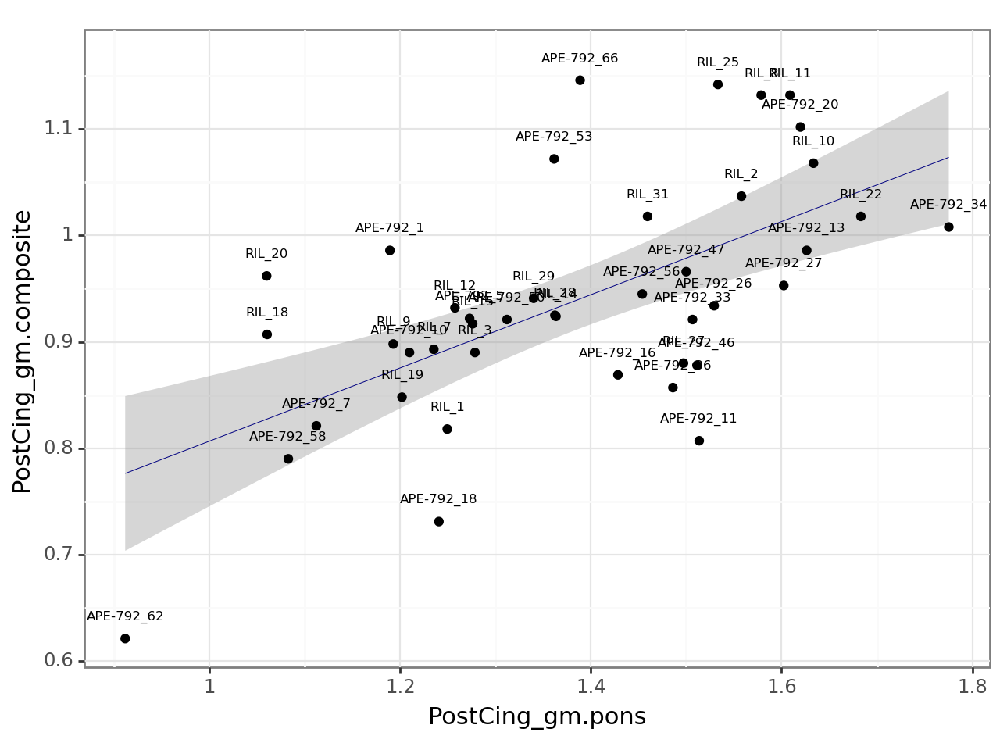

In [6]:
for var in [ele for ele in FDG_columns if (ele in pons.columns) & (ele in composite.columns)]:
    temp1 = pons.loc[pons['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp2 = composite.loc[composite['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp_combined = pd.merge(temp1, temp2, how = 'outer', on = ['ID_ADM'], suffixes=('.pons', '.composite'))
    temp_combined = temp_combined.dropna()
    stat, pval = scipy.stats.spearmanr(temp_combined[var +'.pons'], temp_combined[var +'.composite'])
    print('correlation for', var, 'is', stat.round(2), 'with p-value of', pval.round(4))    

    print(p9.ggplot(temp_combined, p9.aes(x = var +'.pons', y = var +'.composite', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02))

# composite and new_para: (1.0 correlation)

correlation for MTL_gm is 1.0 with p-value of 0.0


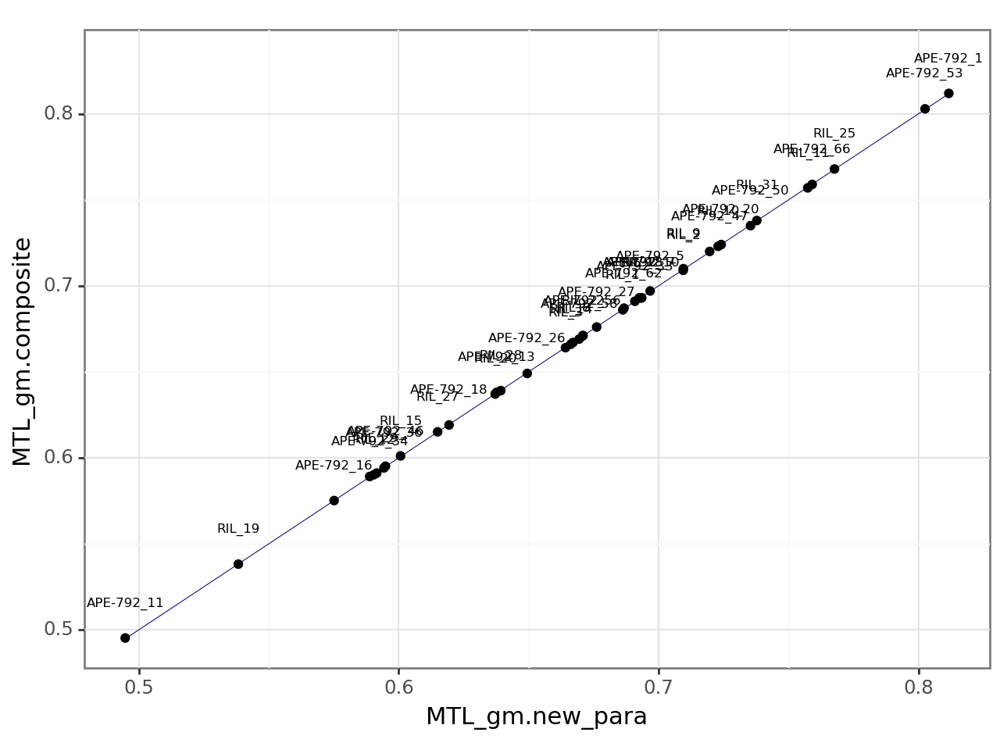


correlation for FRONTAL_gm is 1.0 with p-value of 0.0


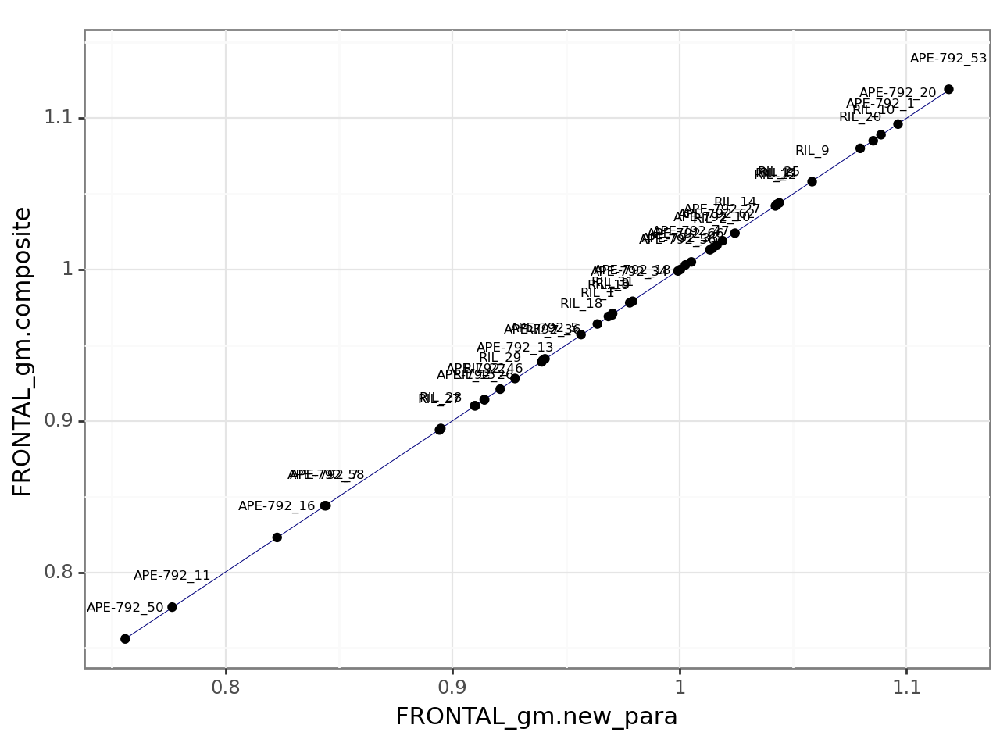


correlation for AC_gm is 1.0 with p-value of 0.0


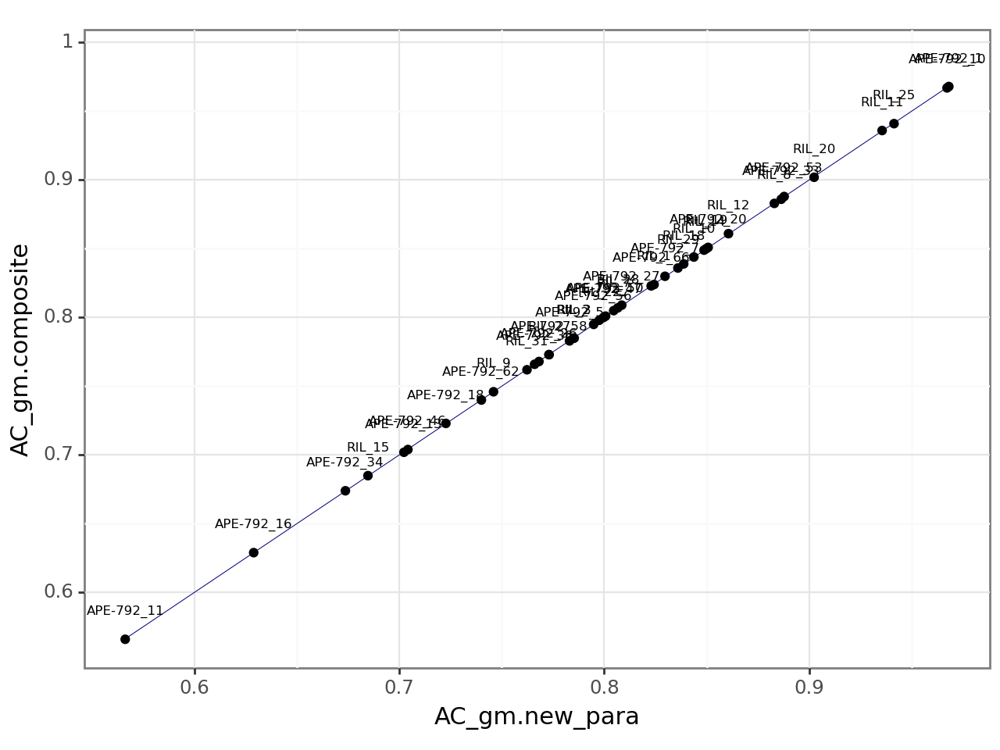


correlation for Precun_gm is 1.0 with p-value of 0.0


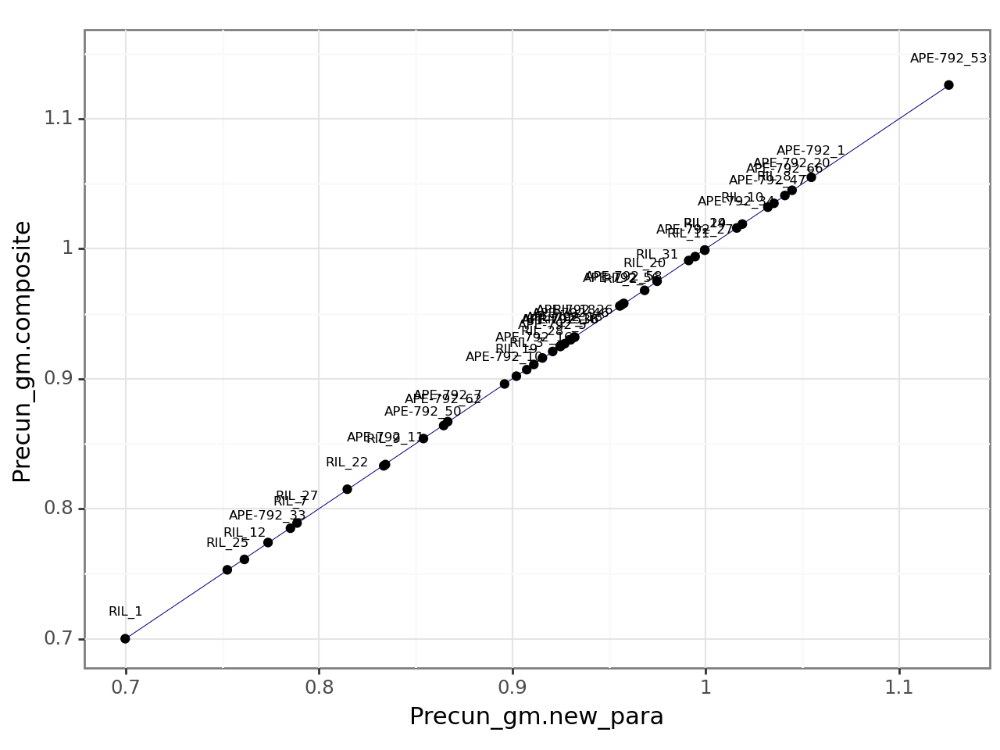


correlation for Par_gm is 1.0 with p-value of 0.0


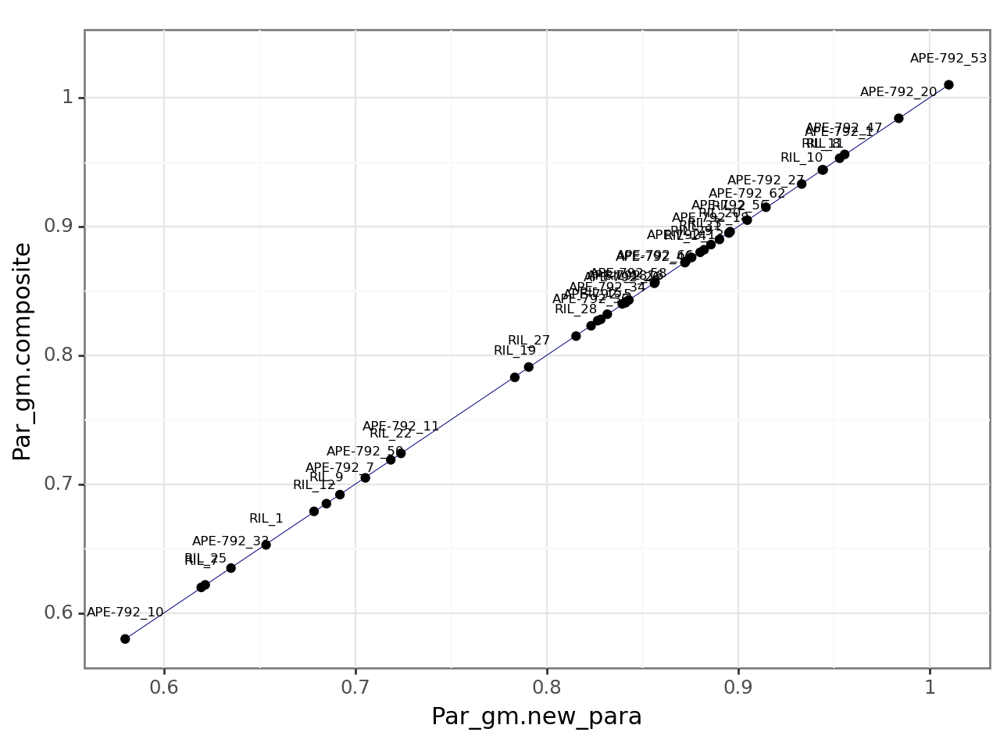


correlation for Temp_gm is 1.0 with p-value of 0.0


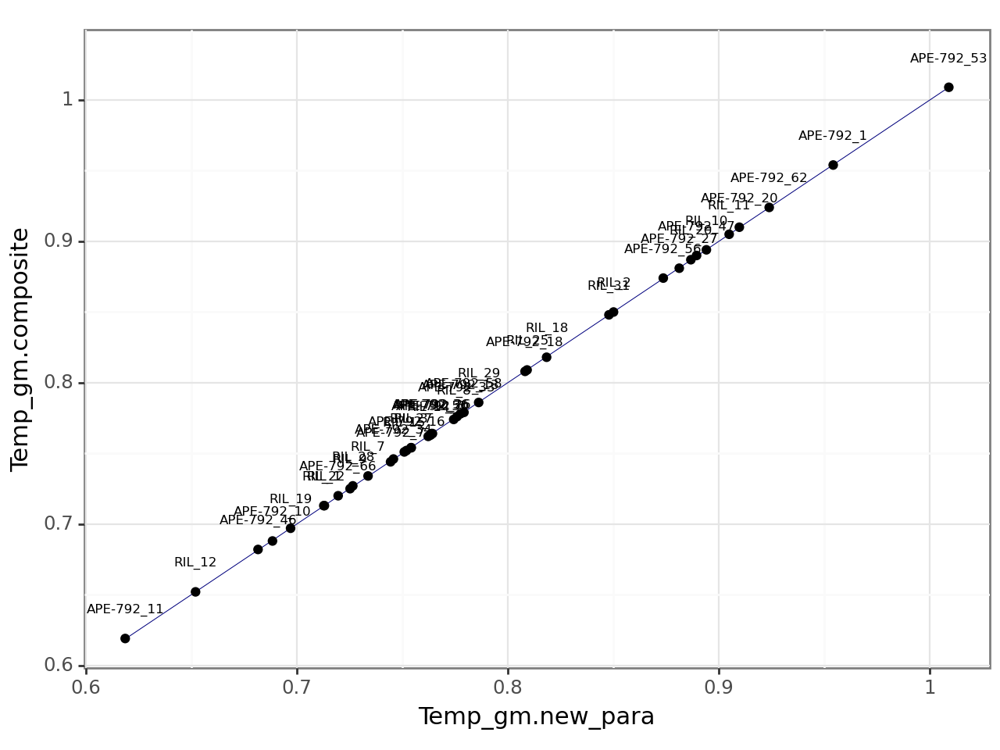


correlation for PostCing_gm is 1.0 with p-value of 0.0


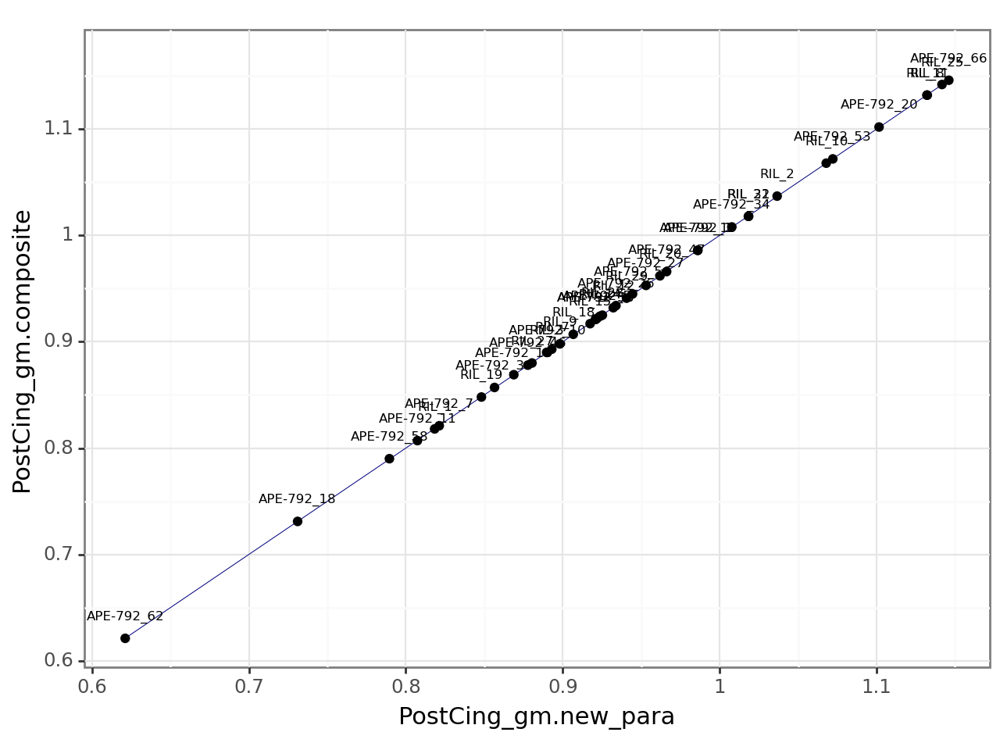

In [7]:
for var in [ele for ele in FDG_columns if (ele in new_para.columns) & (ele in composite.columns)]:
    temp1 = new_para.loc[new_para['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp2 = composite.loc[composite['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp_combined = pd.merge(temp1, temp2, how = 'outer', on = ['ID_ADM'], suffixes=('.new_para', '.composite'))
    temp_combined = temp_combined.dropna()
    stat, pval = scipy.stats.spearmanr(temp_combined[var +'.new_para'], temp_combined[var +'.composite'])
    print('correlation for', var, 'is', stat.round(2), 'with p-value of', pval.round(4))    

    print(p9.ggplot(temp_combined, p9.aes(x = var +'.new_para', y = var +'.composite', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02))

# composite and ras (0.77-0.9 correlation)

correlation for Avg_PCC is 0.83 with p-value of 0.0


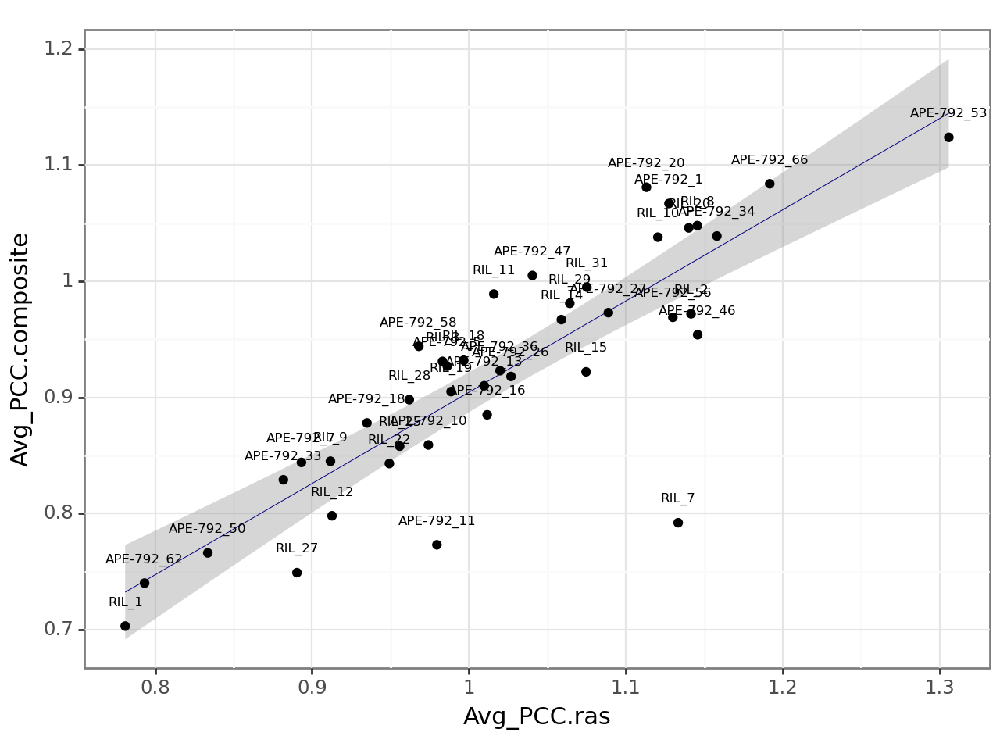


correlation for MTL_gm is 0.9 with p-value of 0.0


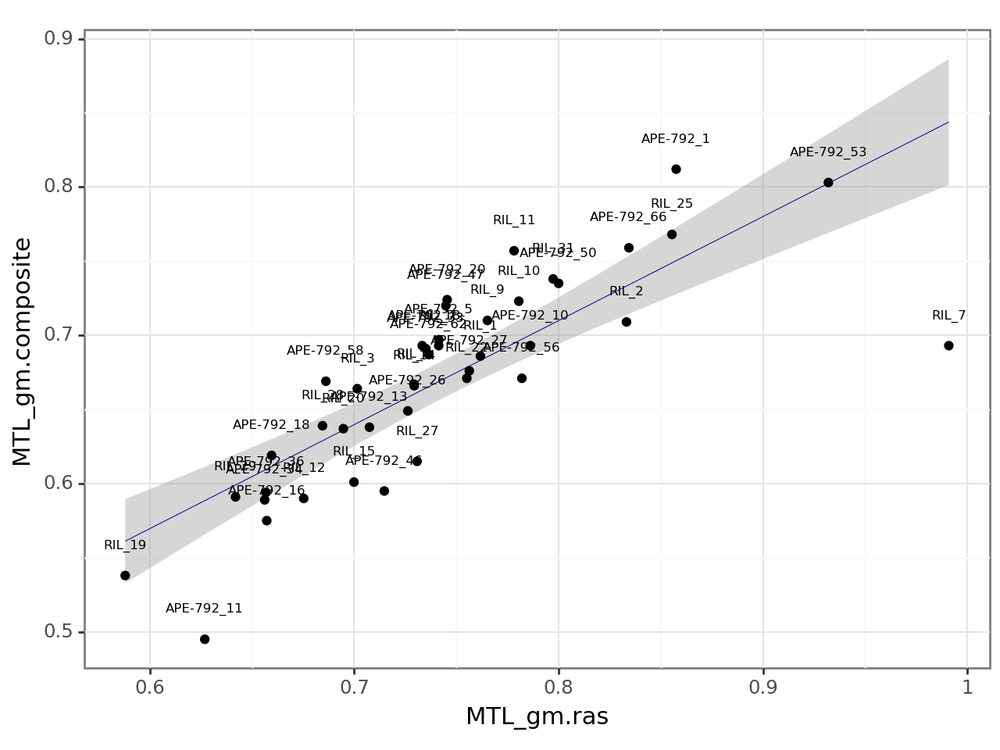


correlation for FRONTAL_gm is 0.79 with p-value of 0.0


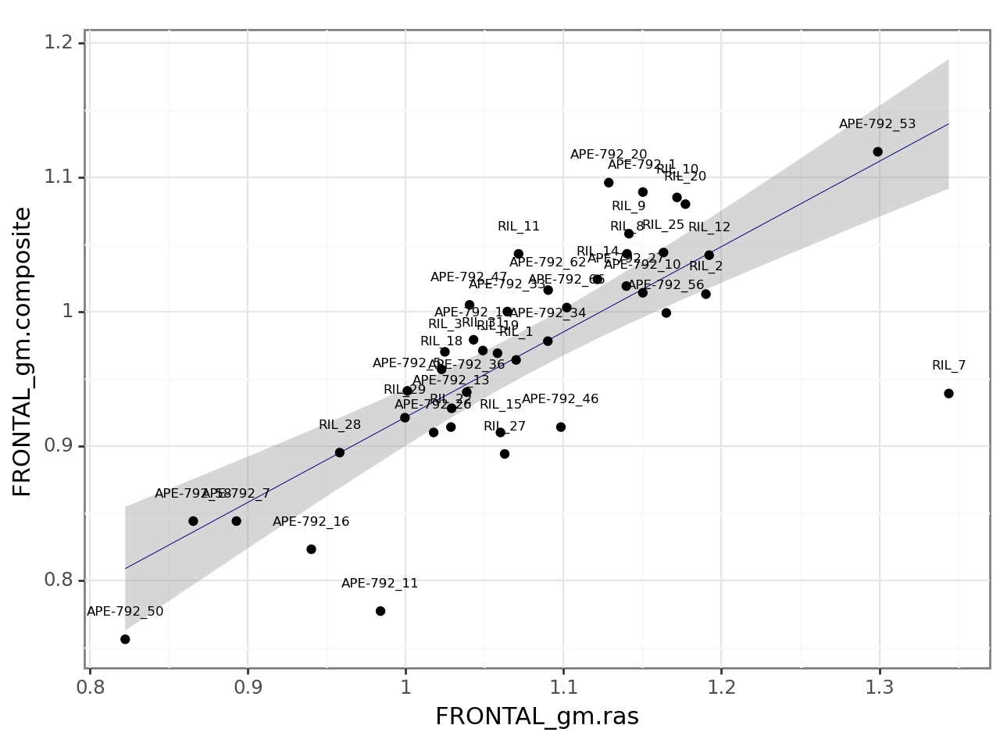


correlation for AC_gm is 0.87 with p-value of 0.0


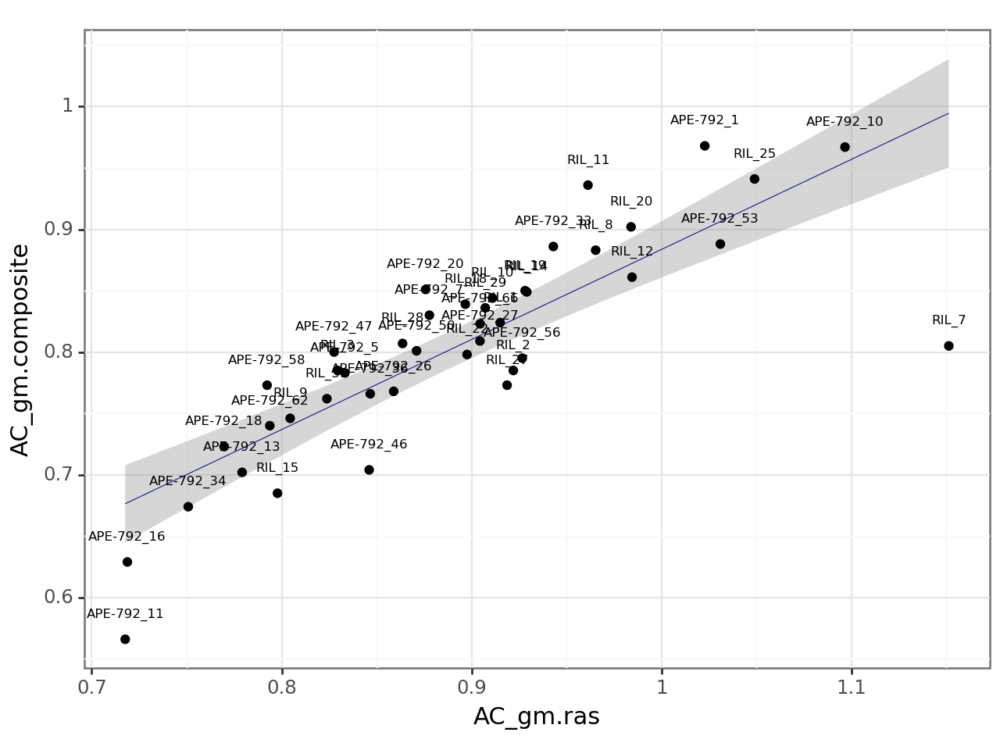


correlation for Precun_gm is 0.77 with p-value of 0.0


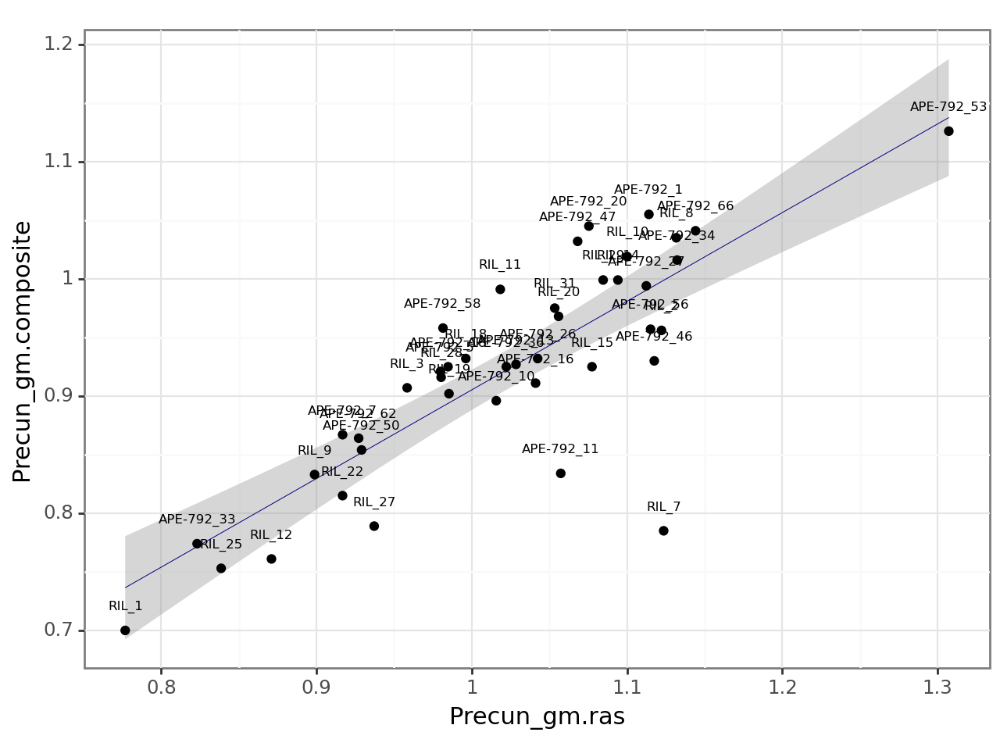


correlation for Par_gm is 0.89 with p-value of 0.0


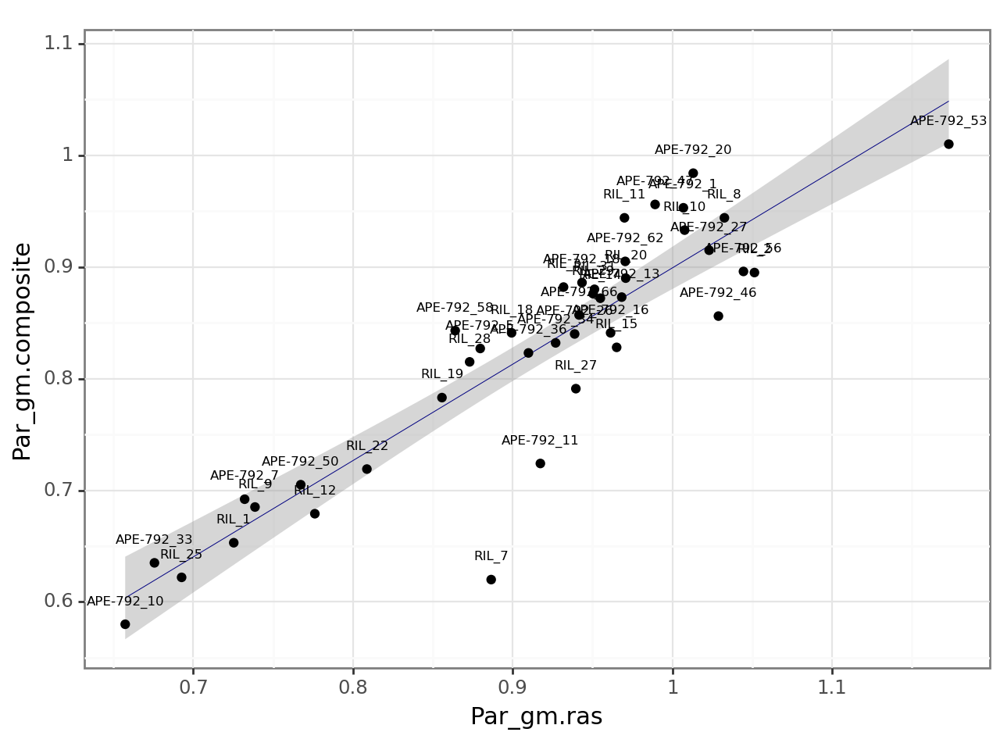


correlation for Temp_gm is 0.82 with p-value of 0.0


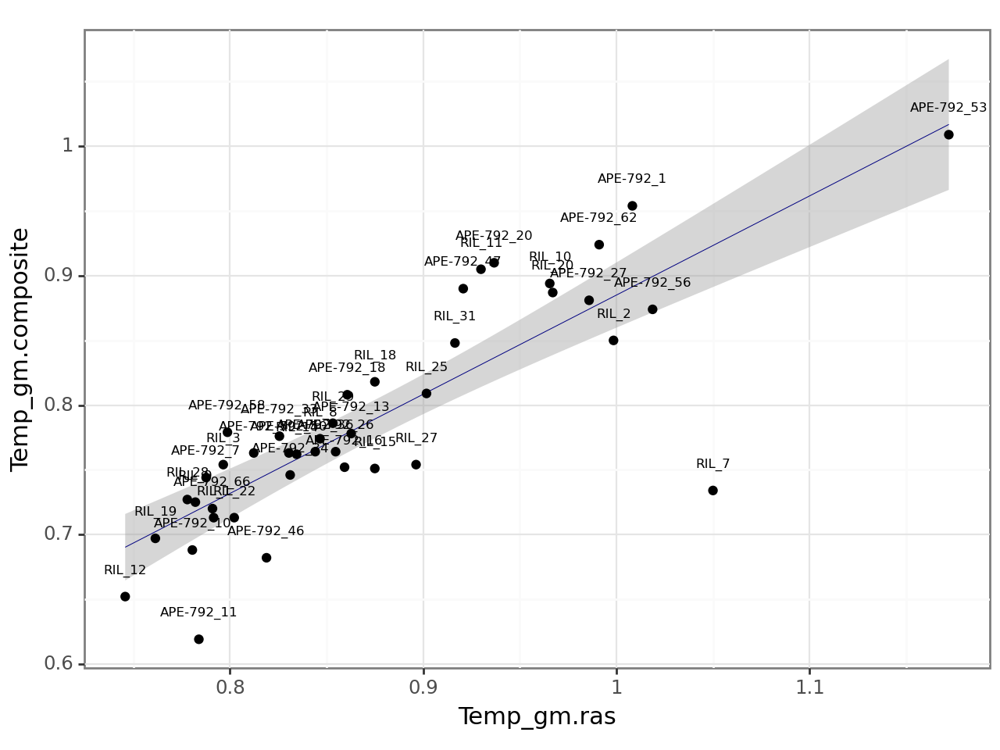


correlation for PostCing_gm is 0.81 with p-value of 0.0


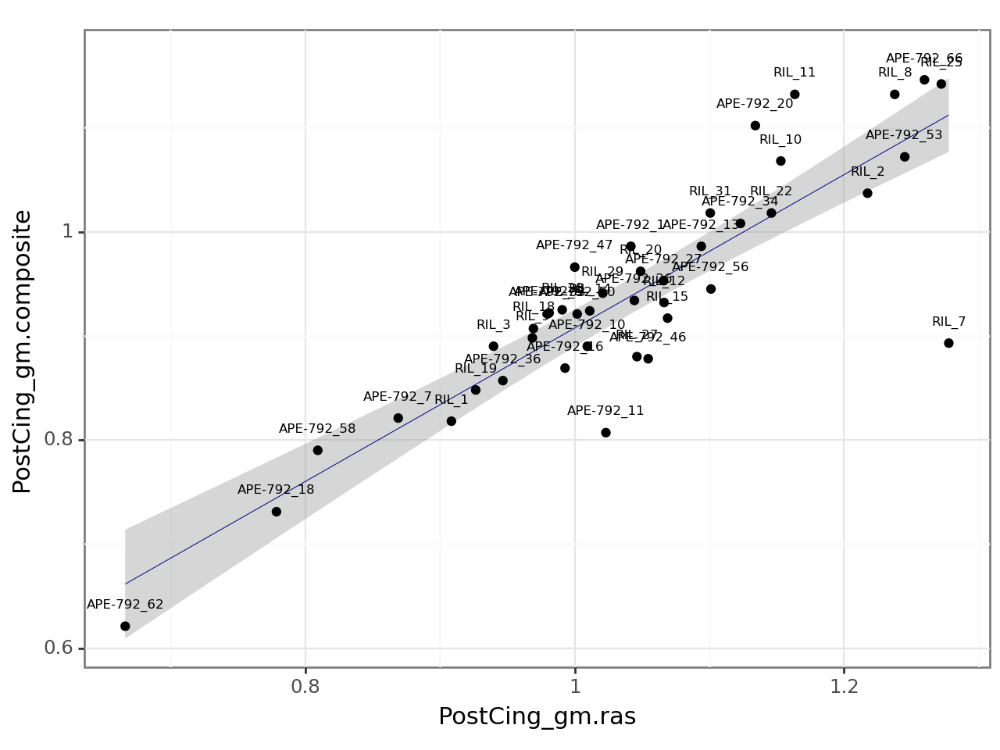

In [8]:
for var in [ele for ele in FDG_columns if (ele in ras.columns) & (ele in composite.columns)]:
    temp1 = ras.loc[ras['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp2 = composite.loc[composite['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp_combined = pd.merge(temp1, temp2, how = 'outer', on = ['ID_ADM'], suffixes=('.ras', '.composite'))
    temp_combined = temp_combined.dropna()
    stat, pval = scipy.stats.spearmanr(temp_combined[var +'.ras'], temp_combined[var +'.composite'])
    print('correlation for', var, 'is', stat.round(2), 'with p-value of', pval.round(4))    

    print(p9.ggplot(temp_combined, p9.aes(x = var +'.ras', y = var +'.composite', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02)
             )   

# para and pons (0.26-0.56 correlation)

correlation for MTL_gm is 0.26 with p-value of 0.0948


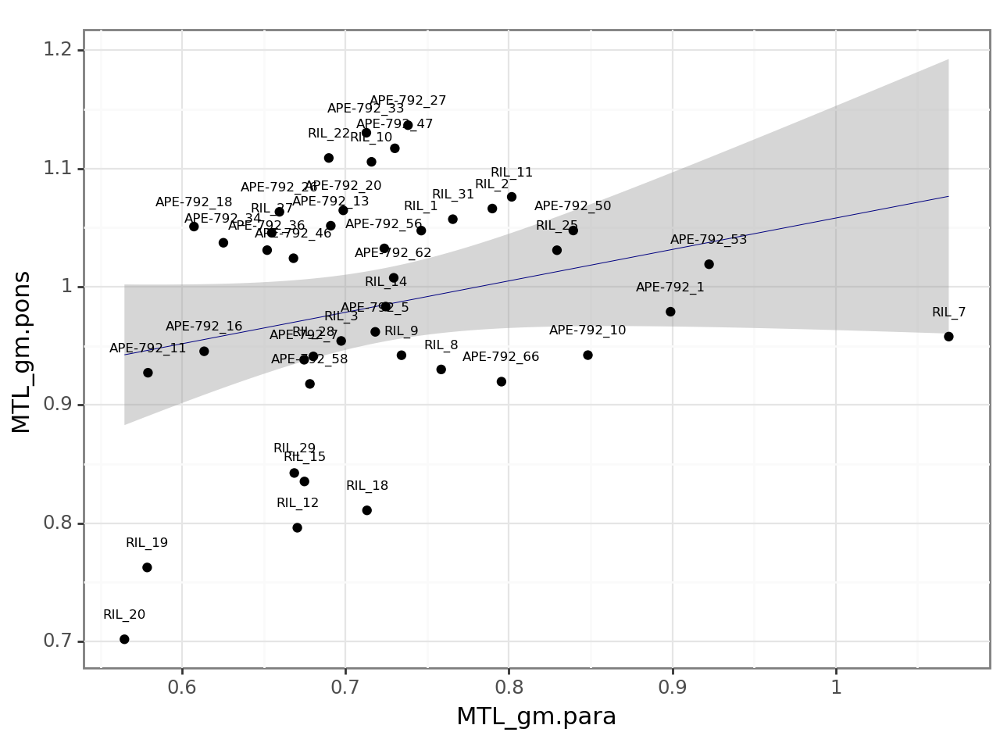


correlation for AC_gm is 0.38 with p-value of 0.0139


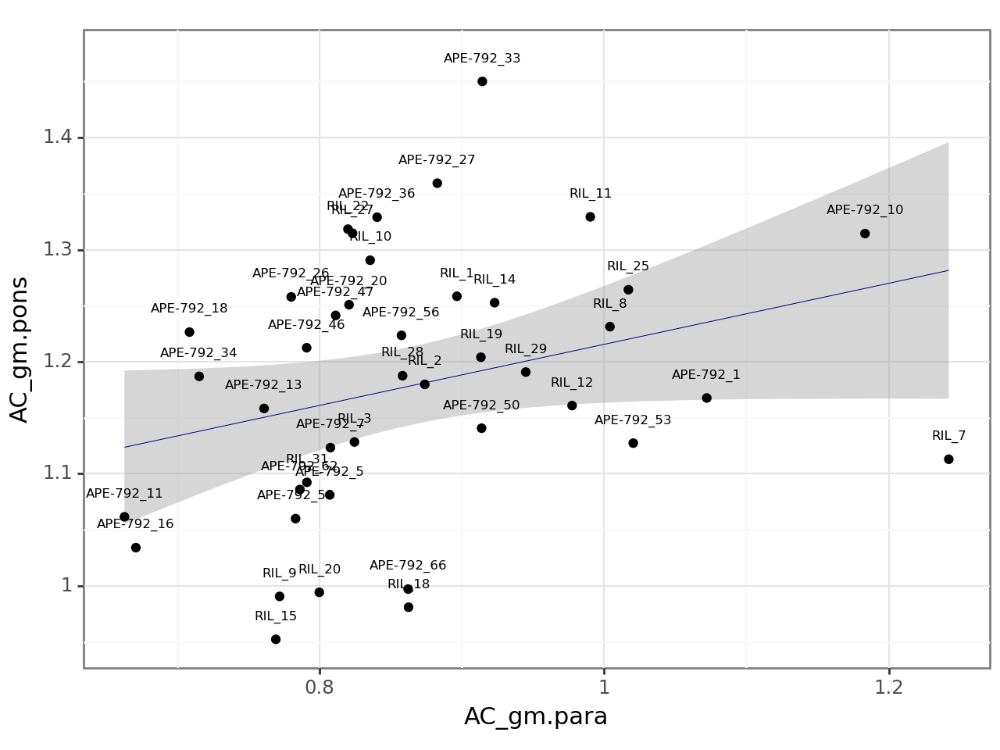


correlation for Precun_gm is 0.41 with p-value of 0.0076


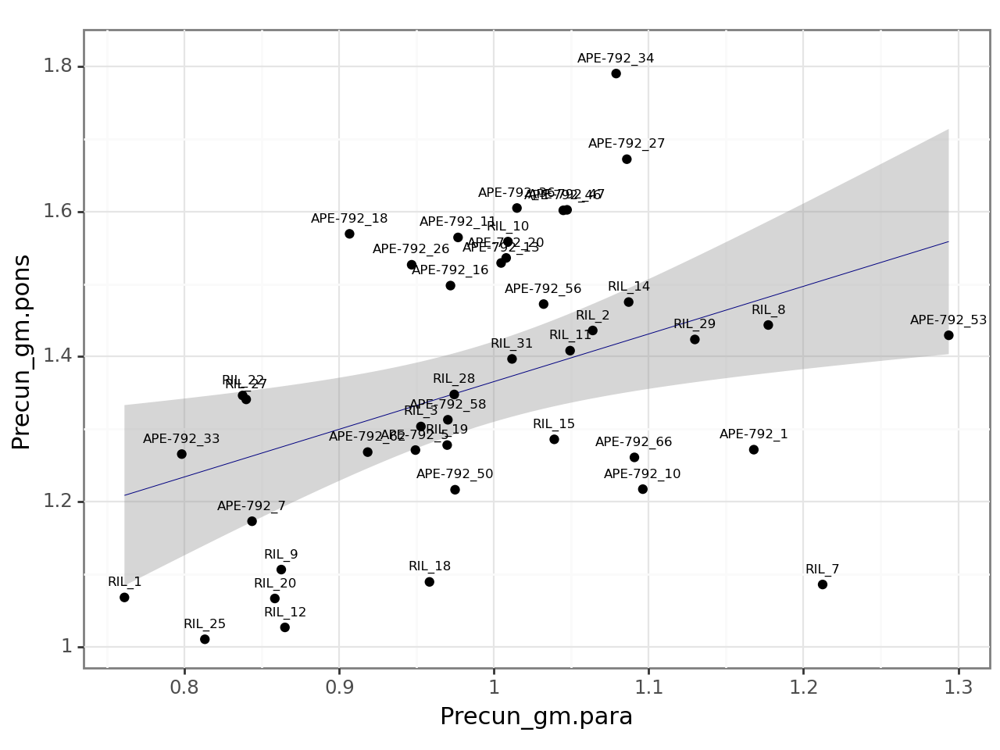


correlation for Par_gm is 0.56 with p-value of 0.0001


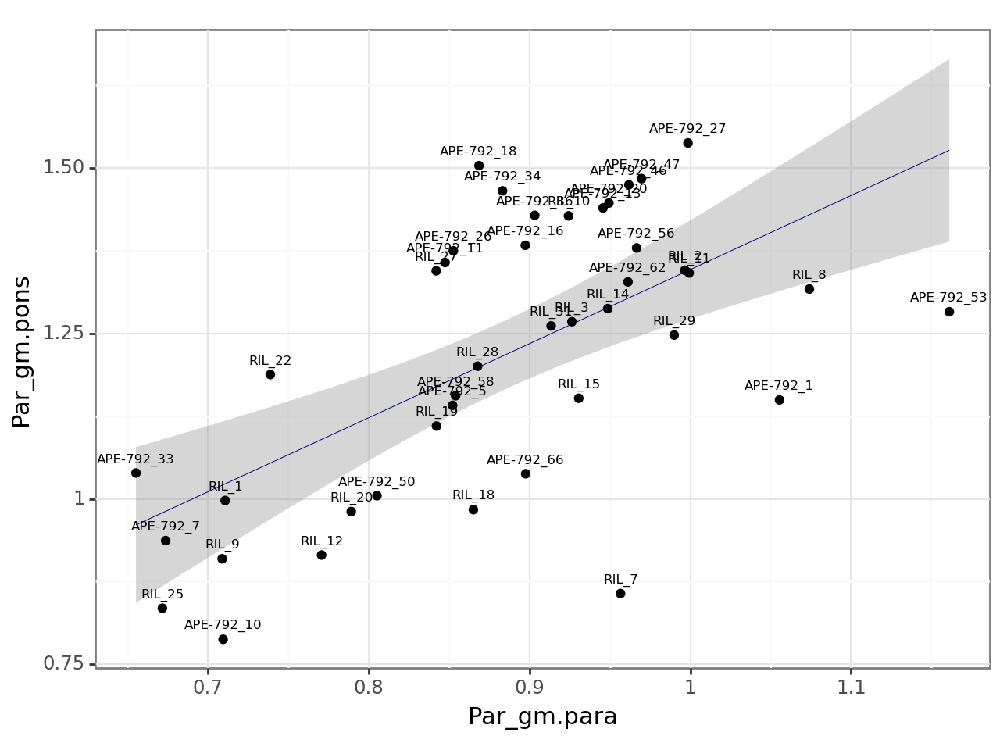


correlation for Temp_gm is 0.47 with p-value of 0.0015


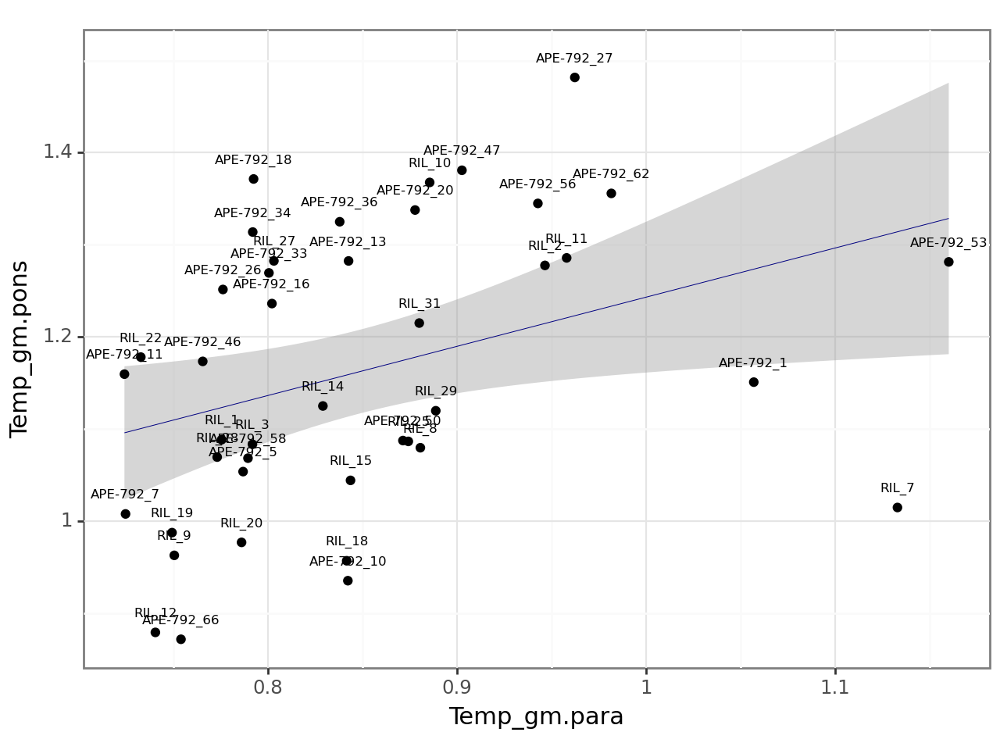


correlation for PostCing_gm is 0.49 with p-value of 0.0011


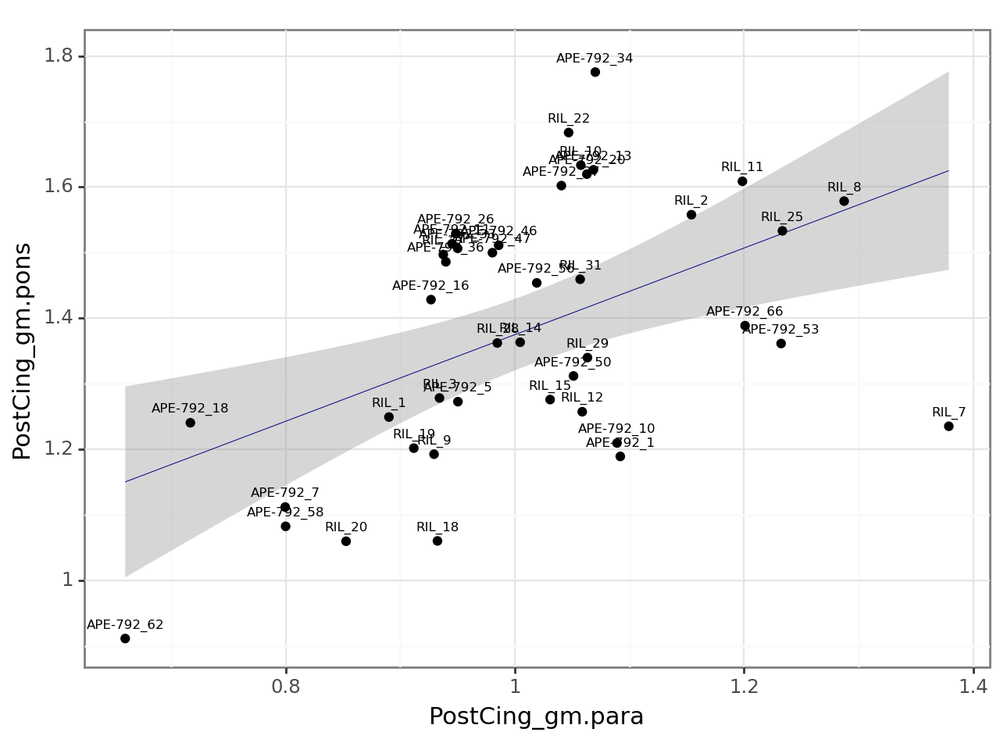

In [9]:
for var in [ele for ele in FDG_columns if (ele in para.columns) & (ele in pons.columns)]:
    temp1 = para.loc[para['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp2 = pons.loc[pons['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp_combined = pd.merge(temp1, temp2, how = 'outer', on = ['ID_ADM'], suffixes=('.para', '.pons'))
    temp_combined = temp_combined.dropna()
    stat, pval = scipy.stats.spearmanr(temp_combined[var +'.para'], temp_combined[var +'.pons'])
    print('correlation for', var, 'is', stat.round(2), 'with p-value of', pval.round(4))    

    print(p9.ggplot(temp_combined, p9.aes(x = var +'.para', y = var +'.pons', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02))

# para and new_para: similar (0.68-0.84 correlation)

correlation for MTL_gm is 0.84 with p-value of 0.0


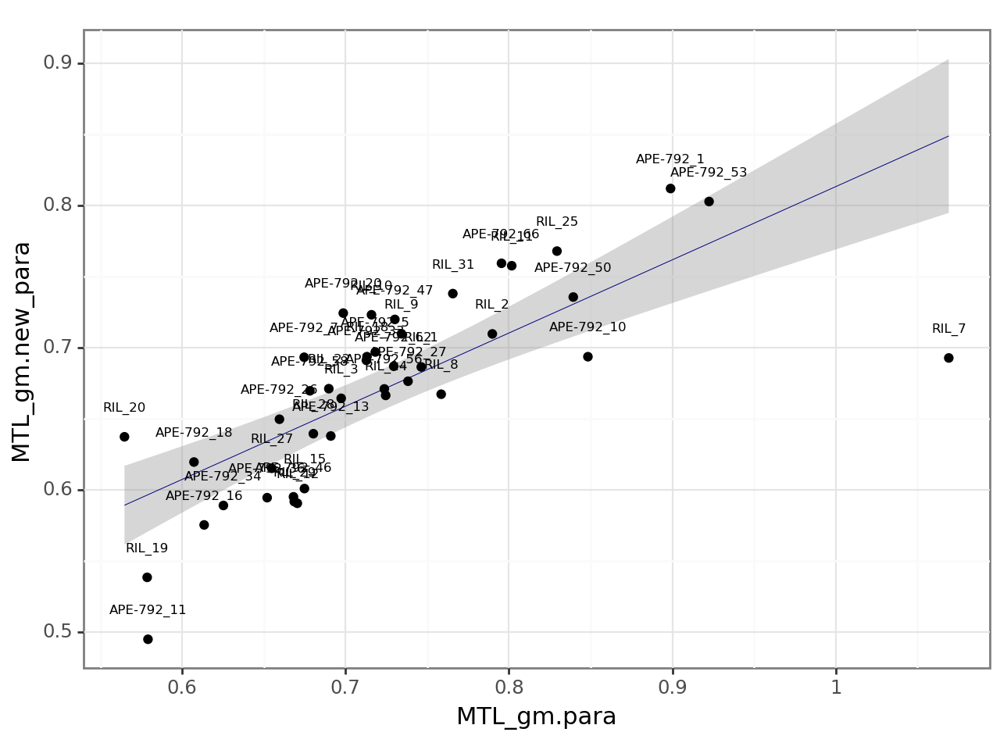


correlation for AC_gm is 0.83 with p-value of 0.0


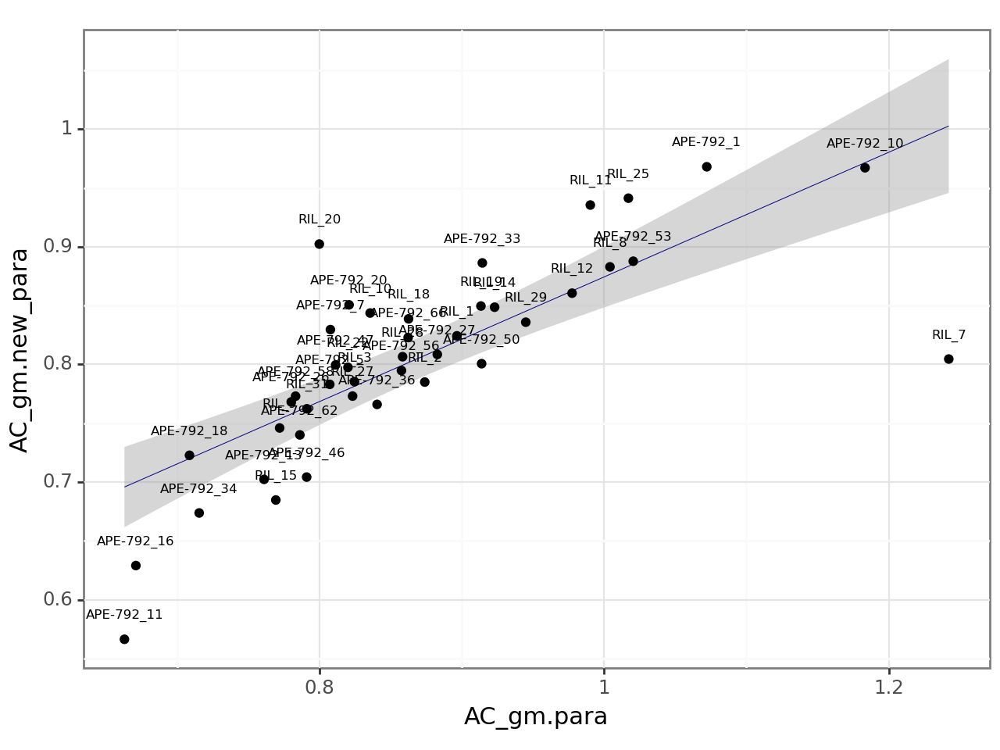


correlation for Precun_gm is 0.68 with p-value of 0.0


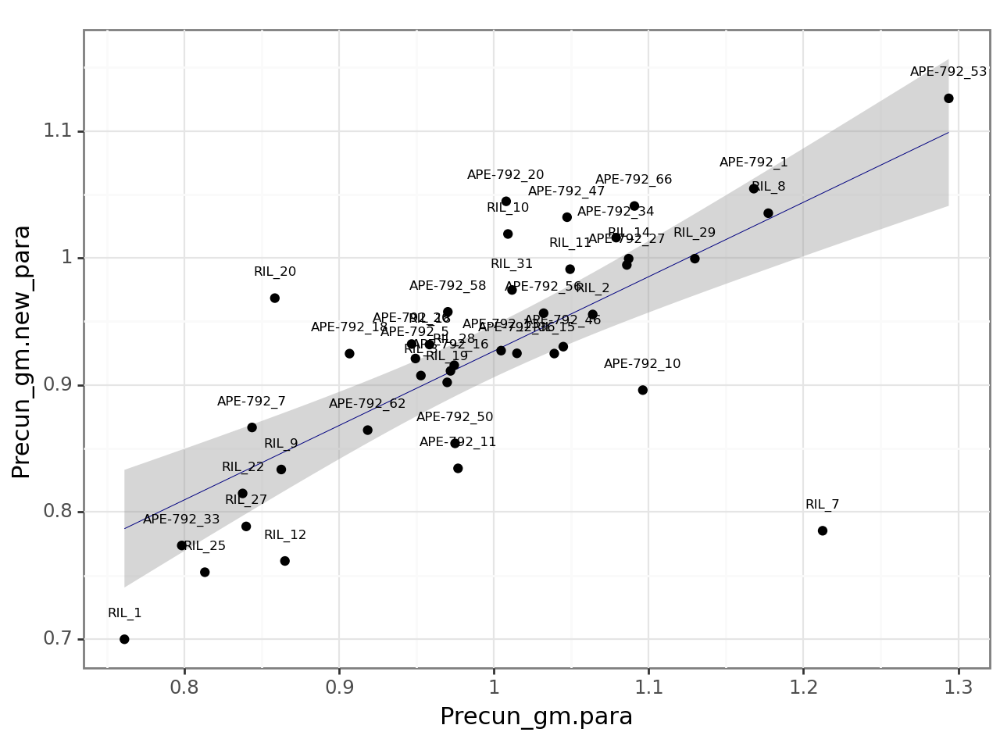


correlation for Par_gm is 0.81 with p-value of 0.0


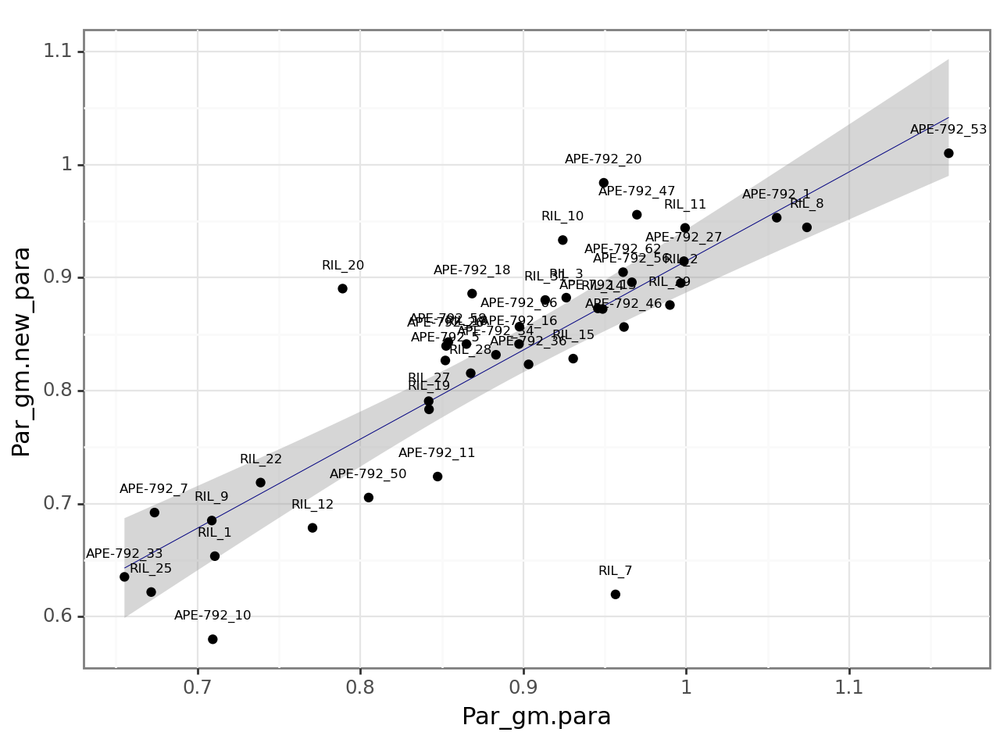


correlation for Temp_gm is 0.76 with p-value of 0.0


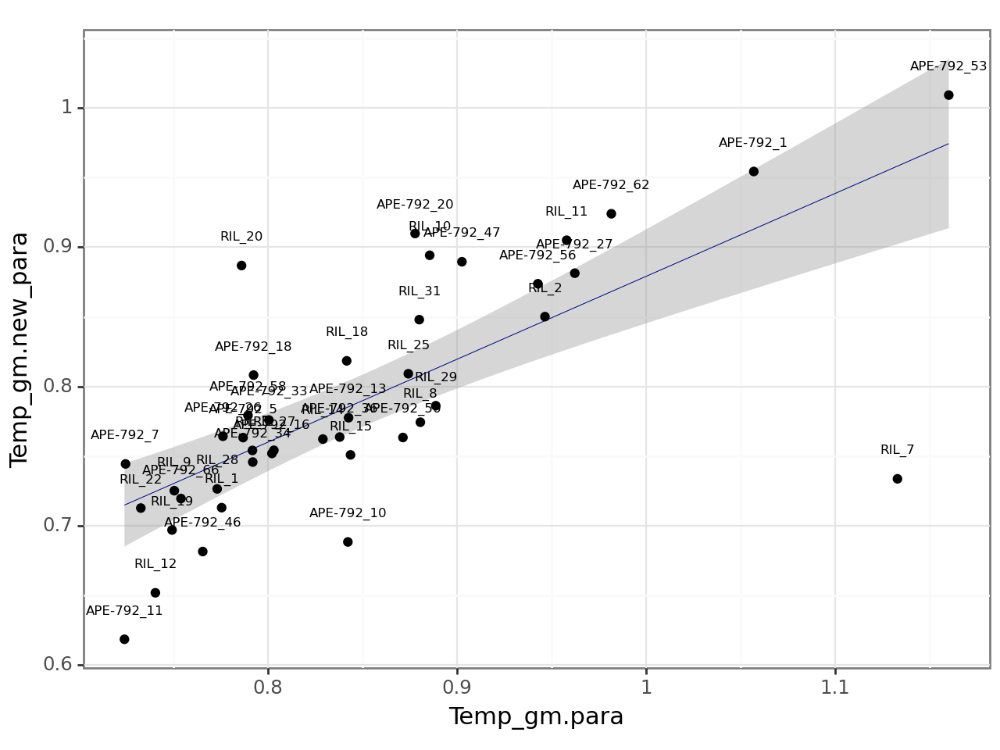


correlation for PostCing_gm is 0.78 with p-value of 0.0


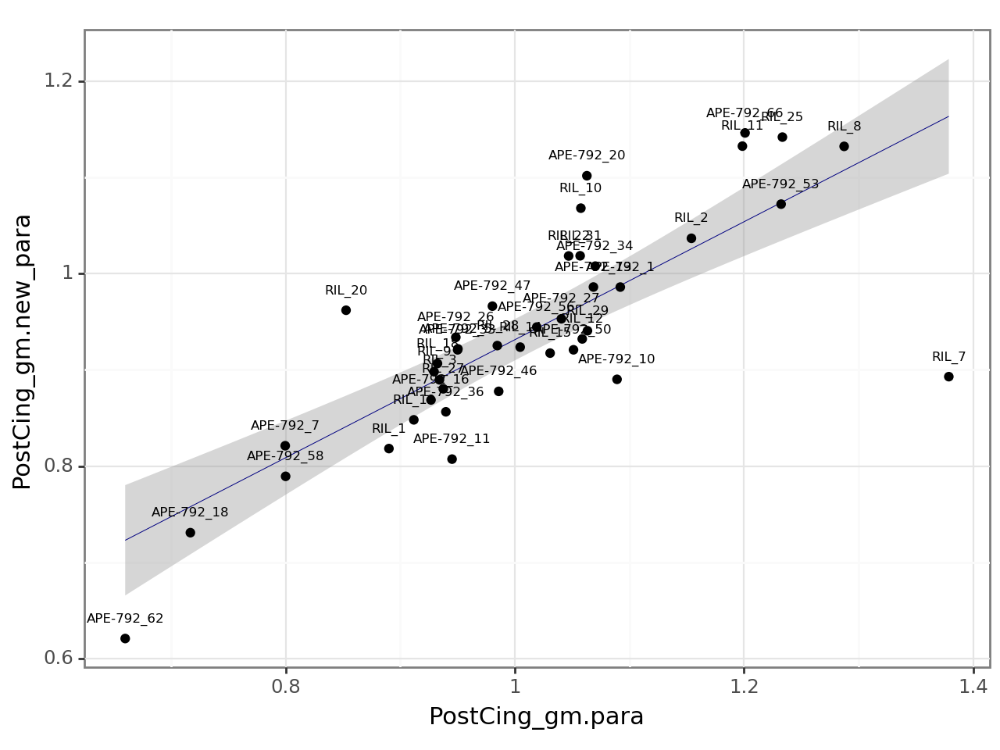

In [10]:
for var in [ele for ele in FDG_columns if (ele in para.columns) & (ele in new_para.columns)]:
    temp1 = para.loc[para['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp2 = new_para.loc[new_para['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp_combined = pd.merge(temp1, temp2, how = 'outer', on = ['ID_ADM'], suffixes=('.para', '.new_para'))
    temp_combined = temp_combined.dropna()
    stat, pval = scipy.stats.spearmanr(temp_combined[var +'.para'], temp_combined[var +'.new_para'])
    print('correlation for', var, 'is', stat.round(2), 'with p-value of', pval.round(4))    

    print(p9.ggplot(temp_combined, p9.aes(x = var +'.para', y = var +'.new_para', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02)
             )    

# para and ras (0.84-0.9 correlation)

correlation for Avg_PCC is 0.87 with p-value of 0.0


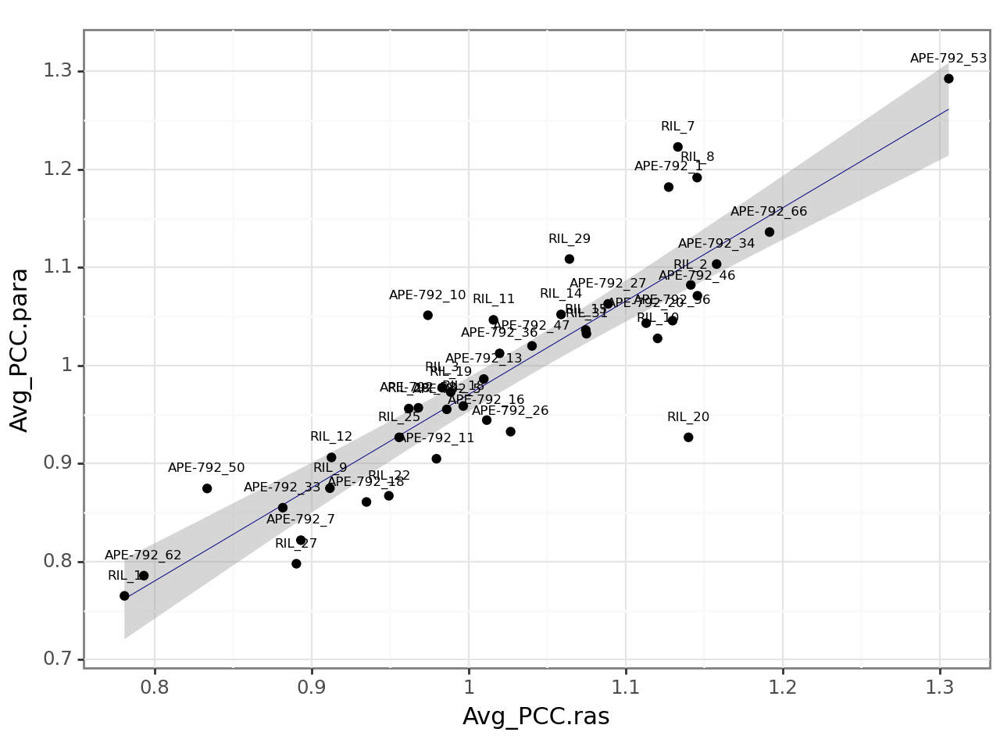


correlation for MTL_gm is 0.9 with p-value of 0.0


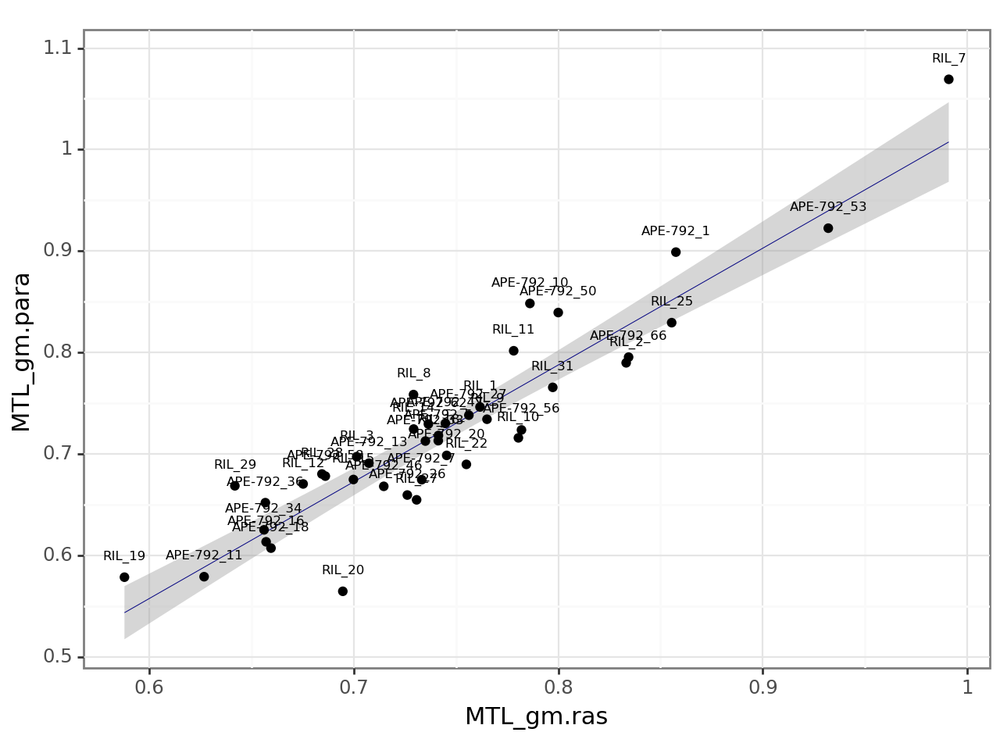


correlation for AC_gm is 0.89 with p-value of 0.0


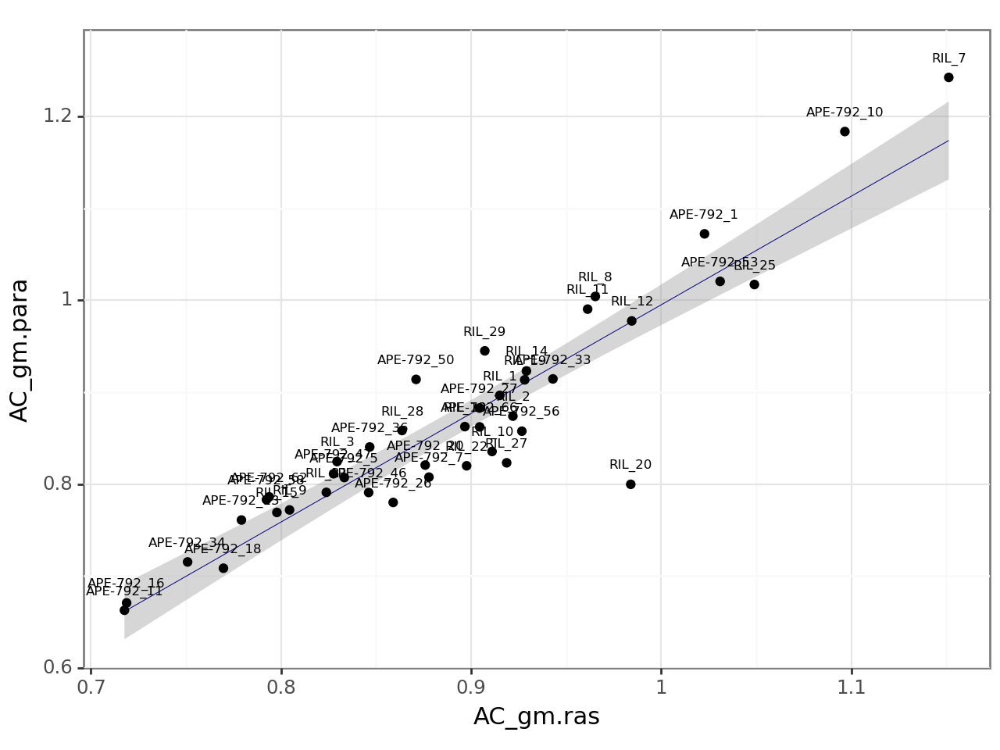


correlation for Precun_gm is 0.86 with p-value of 0.0


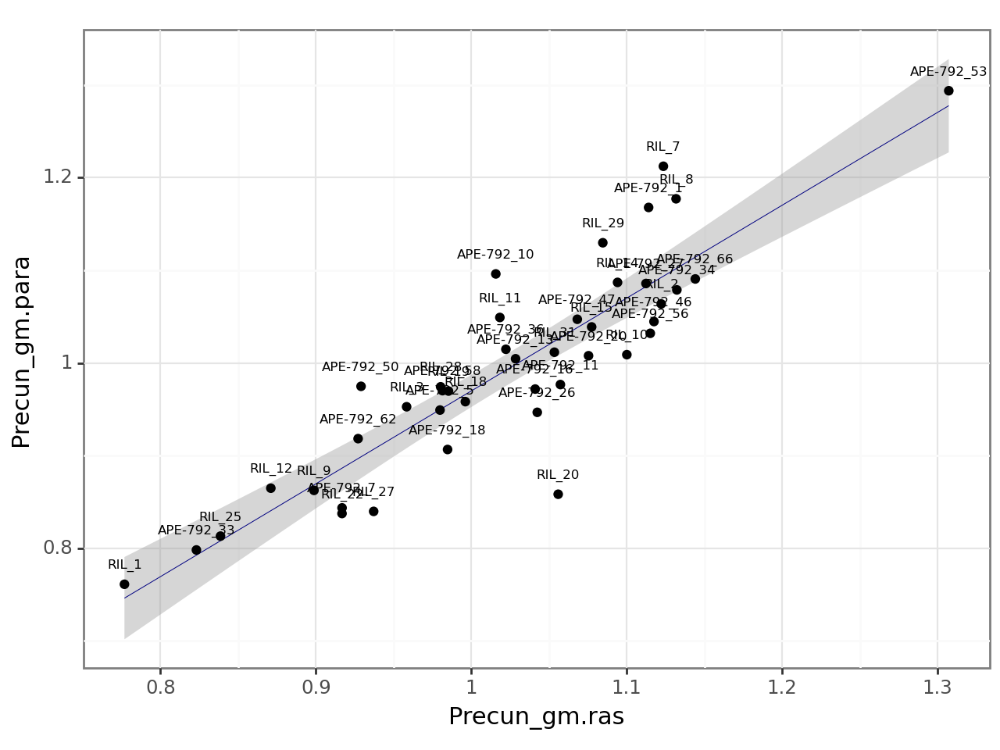


correlation for Par_gm is 0.86 with p-value of 0.0


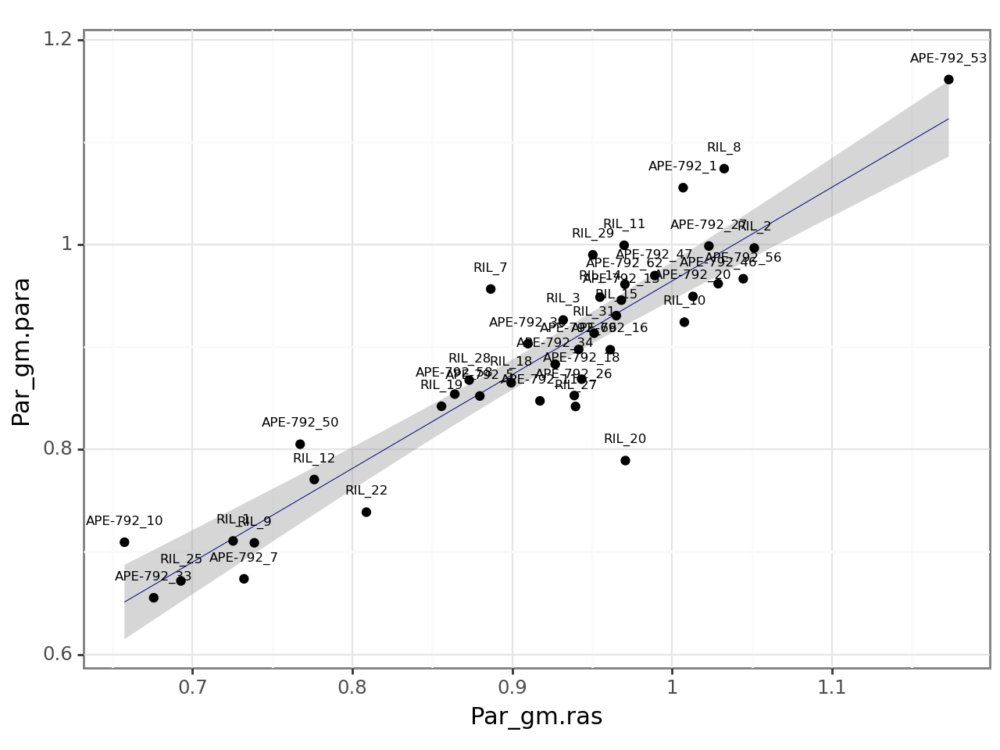


correlation for Temp_gm is 0.84 with p-value of 0.0


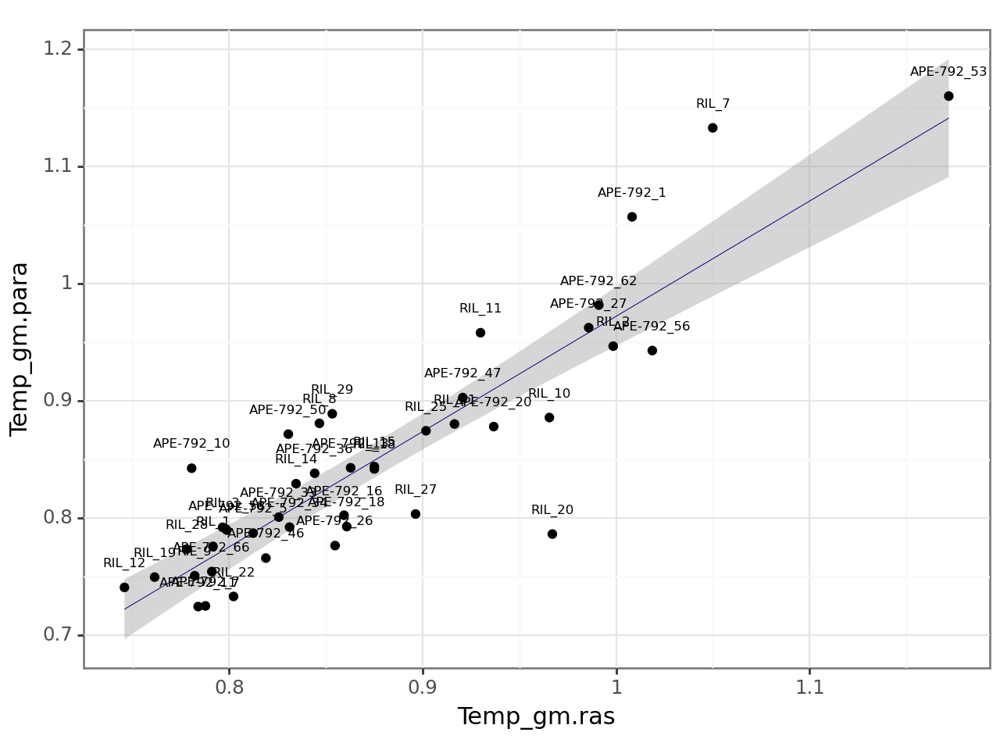


correlation for PostCing_gm is 0.85 with p-value of 0.0


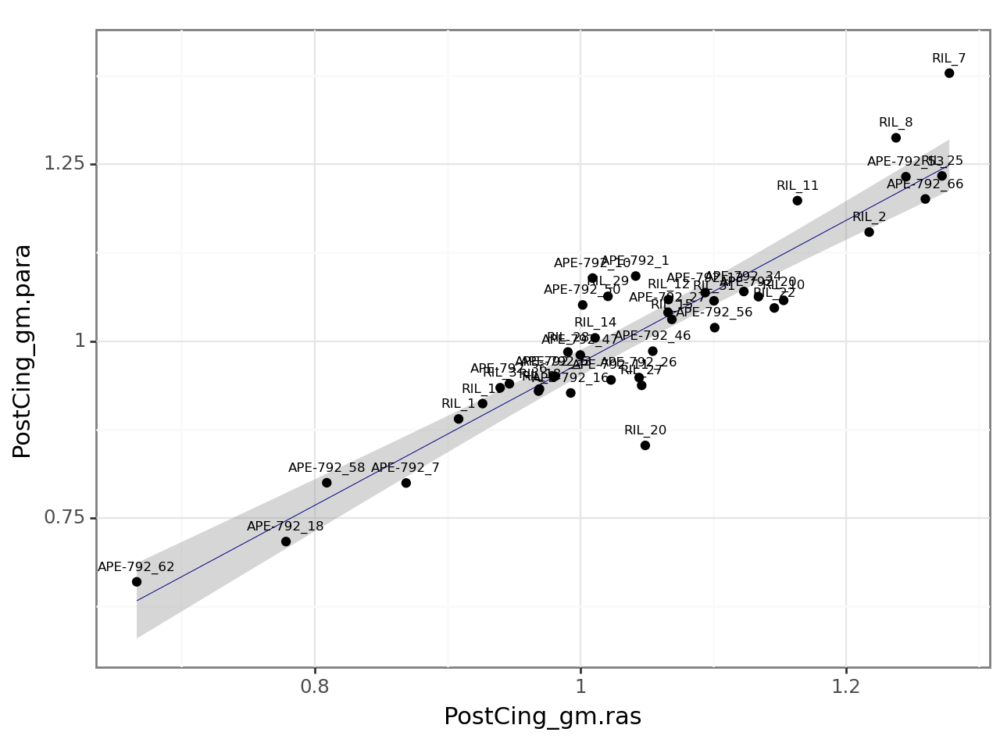

In [11]:
for var in [ele for ele in FDG_columns if (ele in ras.columns) & (ele in para.columns)]:
    temp1 = ras.loc[ras['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp2 = para.loc[para['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp_combined = pd.merge(temp1, temp2, how = 'outer', on = ['ID_ADM'], suffixes=('.ras', '.para'))
    temp_combined = temp_combined.dropna()
    stat, pval = scipy.stats.spearmanr(temp_combined[var +'.ras'], temp_combined[var +'.para'])
    print('correlation for', var, 'is', stat.round(2), 'with p-value of', pval.round(4))    

    print(p9.ggplot(temp_combined, p9.aes(x = var +'.ras', y = var +'.para', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02)
             )   

# pons and new_para (0.34-0.61 correlation)

correlation for MTL_gm is 0.35 with p-value of 0.0247


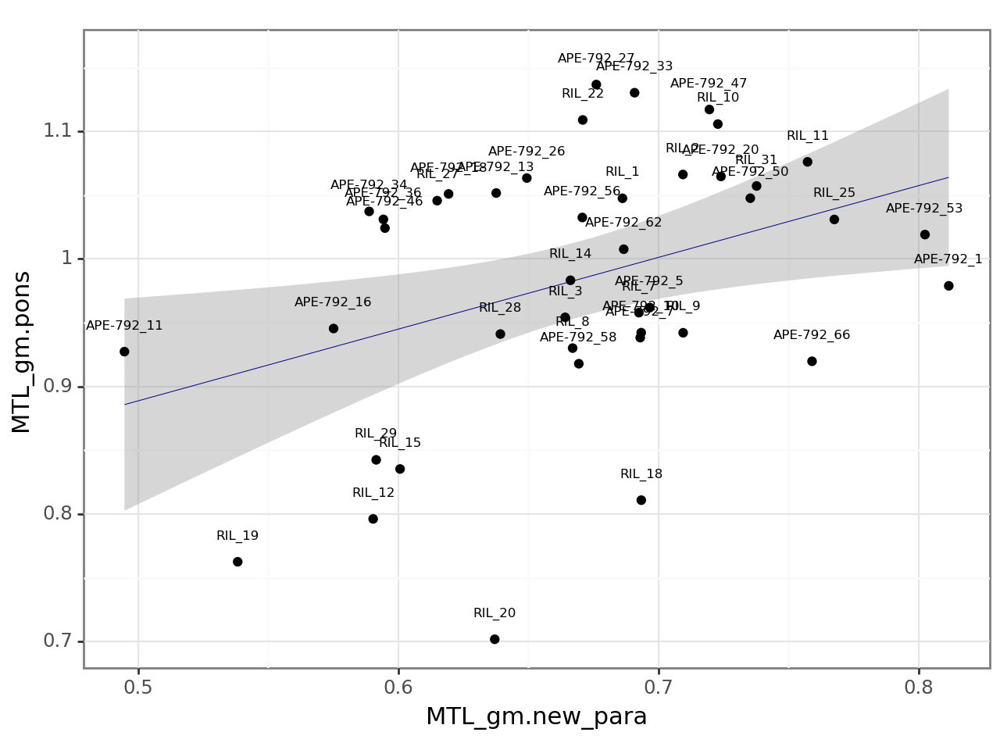


correlation for AC_gm is 0.34 with p-value of 0.0292


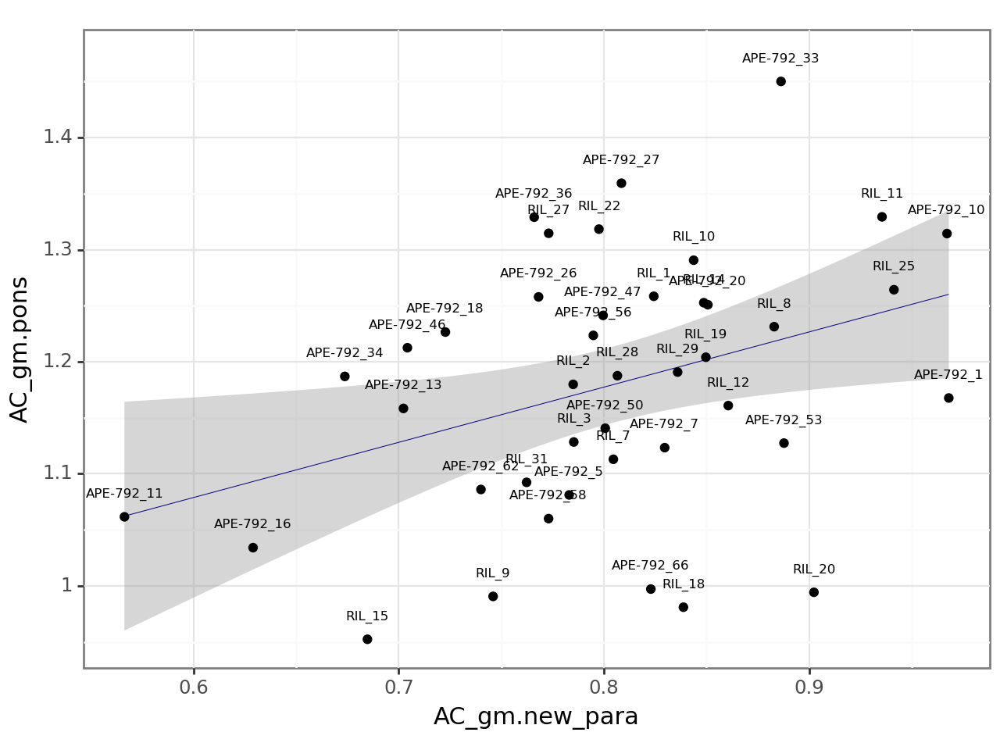


correlation for Precun_gm is 0.53 with p-value of 0.0004


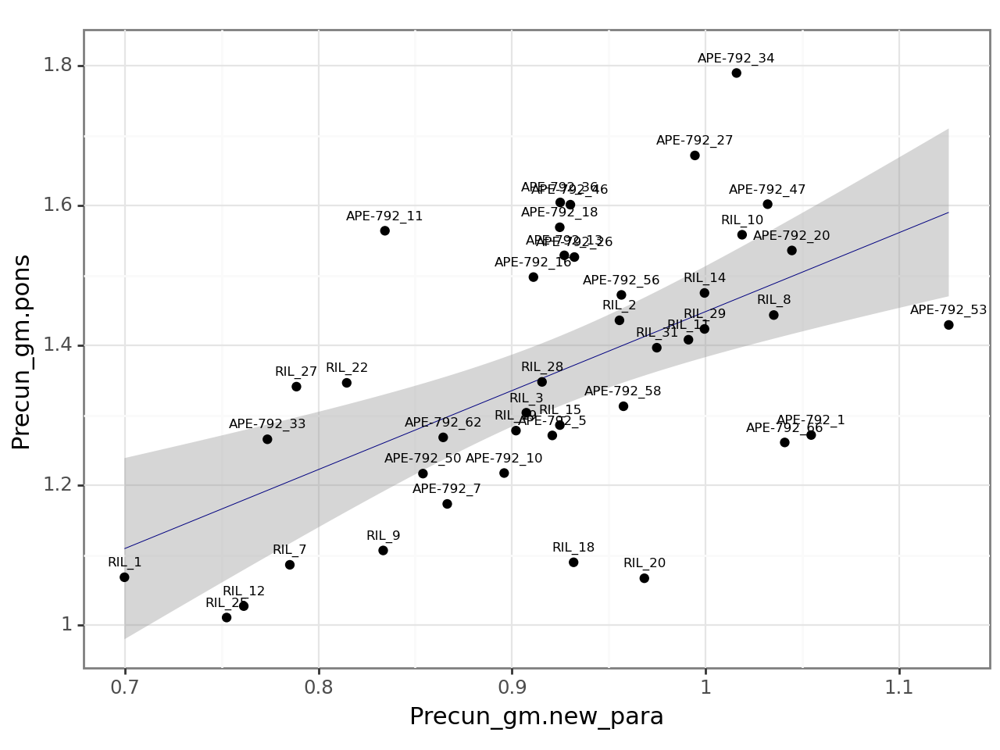


correlation for Par_gm is 0.61 with p-value of 0.0


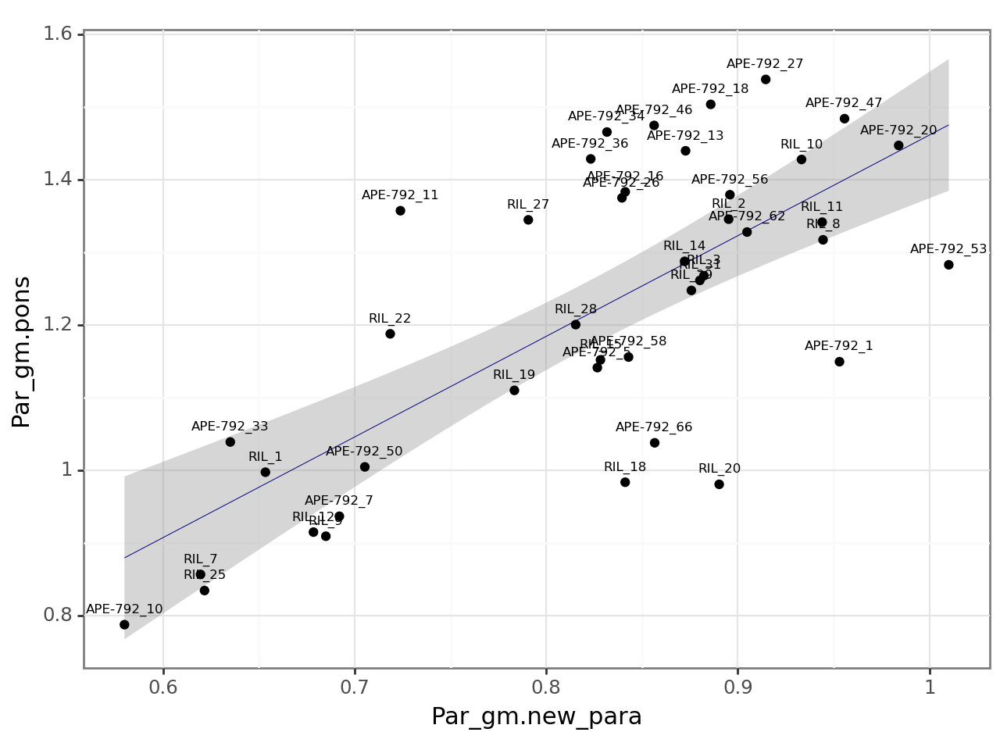


correlation for Temp_gm is 0.56 with p-value of 0.0001


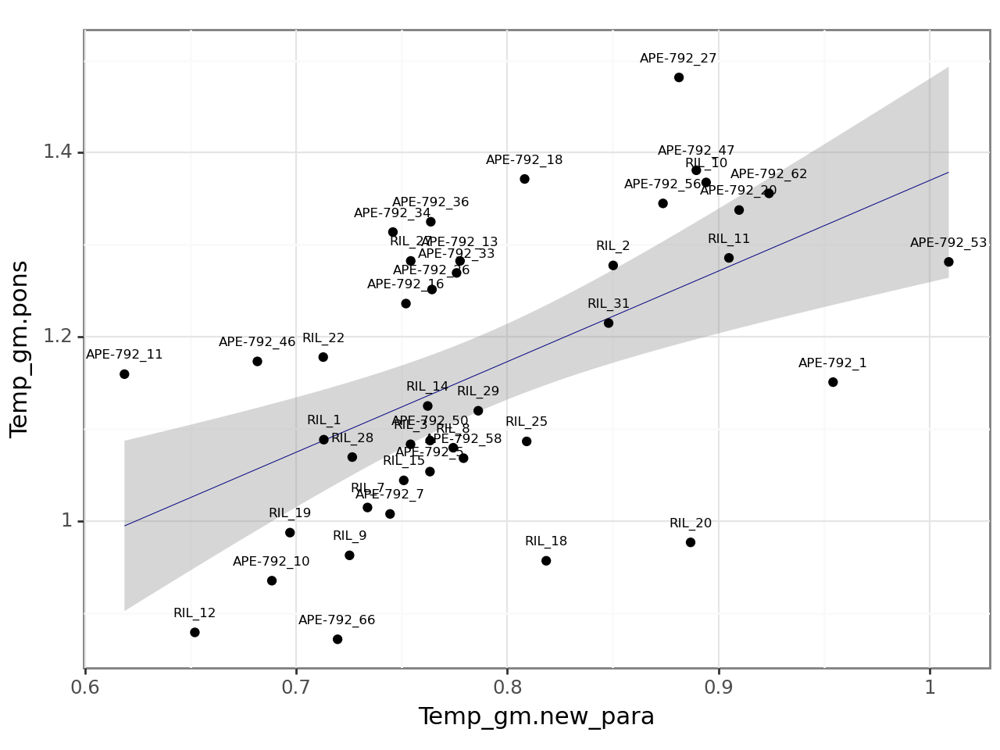


correlation for PostCing_gm is 0.58 with p-value of 0.0001


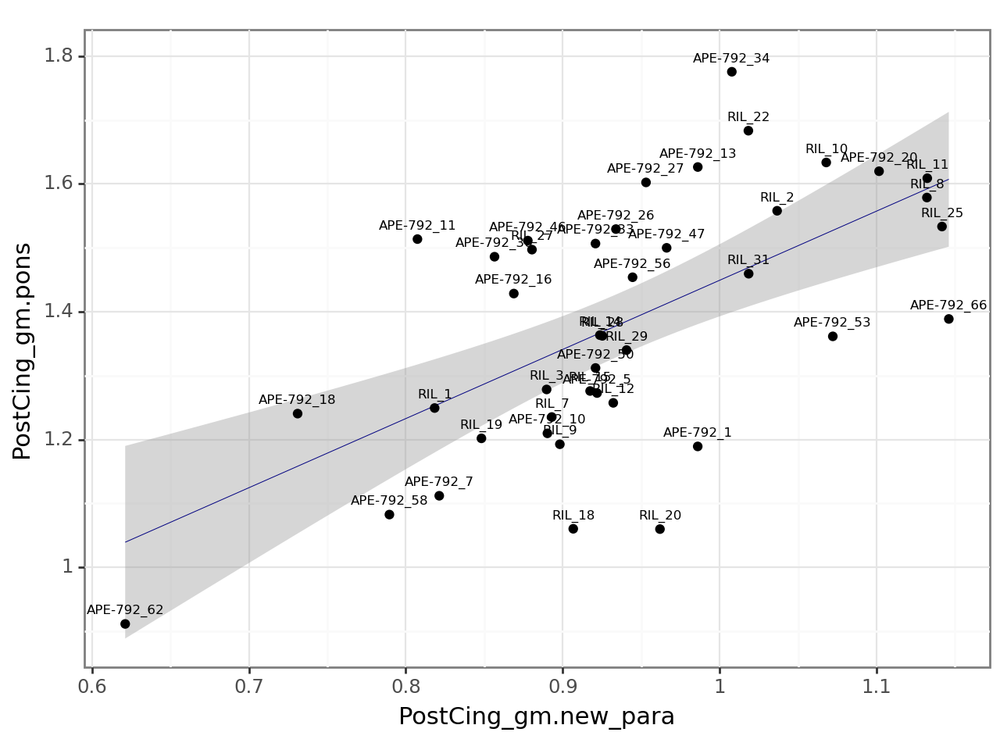

In [12]:
for var in [ele for ele in FDG_columns if (ele in new_para.columns) & (ele in pons.columns)]:
    temp1 = new_para.loc[new_para['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp2 = pons.loc[pons['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp_combined = pd.merge(temp1, temp2, how = 'outer', on = ['ID_ADM'], suffixes=('.new_para', '.pons'))
    temp_combined = temp_combined.dropna()
    stat, pval = scipy.stats.spearmanr(temp_combined[var +'.new_para'], temp_combined[var +'.pons'])
    print('correlation for', var, 'is', stat.round(2), 'with p-value of', pval.round(4))    

    print(p9.ggplot(temp_combined, p9.aes(x = var +'.new_para', y = var +'.pons', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02))

# pons and ras (0.37-0.62 correlation)

correlation for MTL_gm is 0.38 with p-value of 0.0124


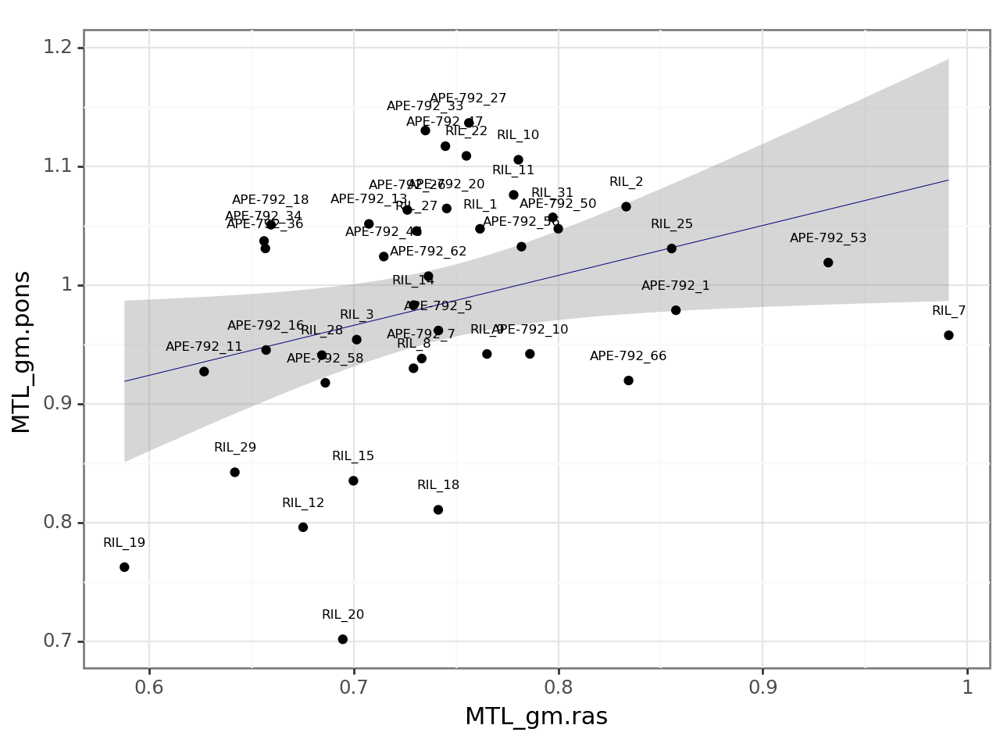


correlation for AC_gm is 0.37 with p-value of 0.0167


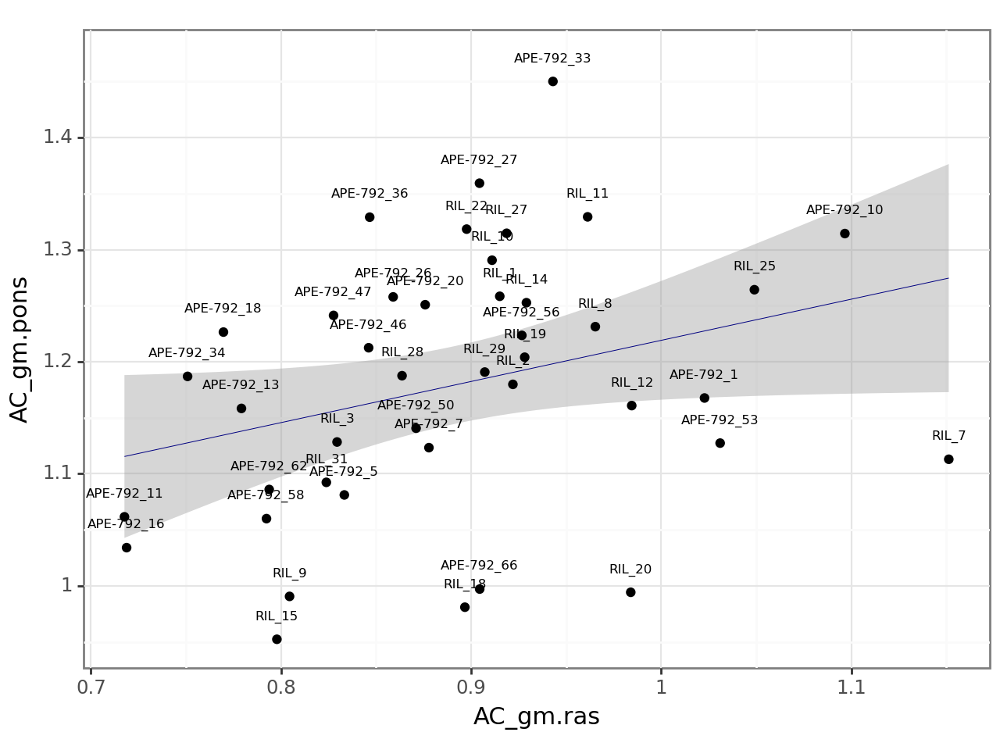


correlation for Precun_gm is 0.52 with p-value of 0.0004


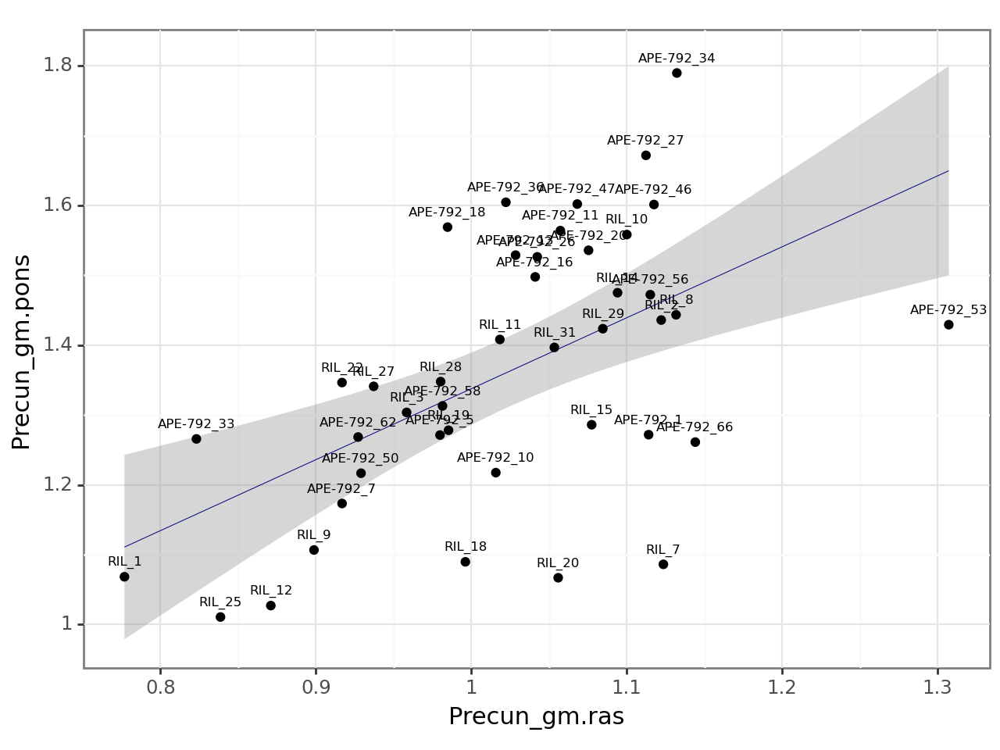


correlation for Par_gm is 0.66 with p-value of 0.0


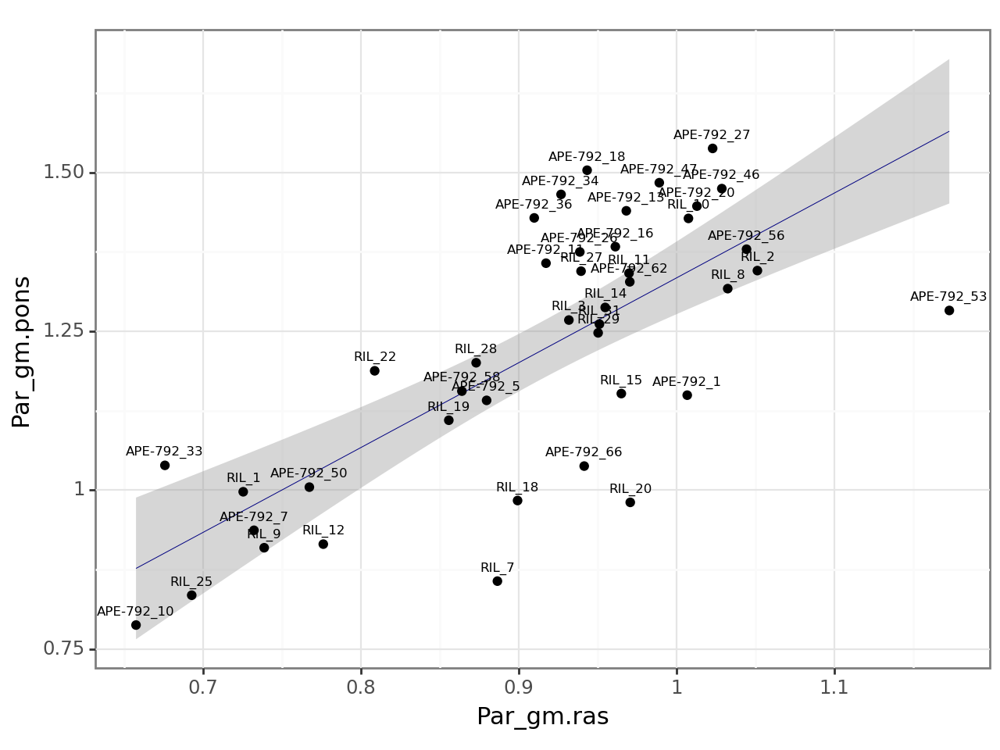


correlation for Temp_gm is 0.56 with p-value of 0.0001


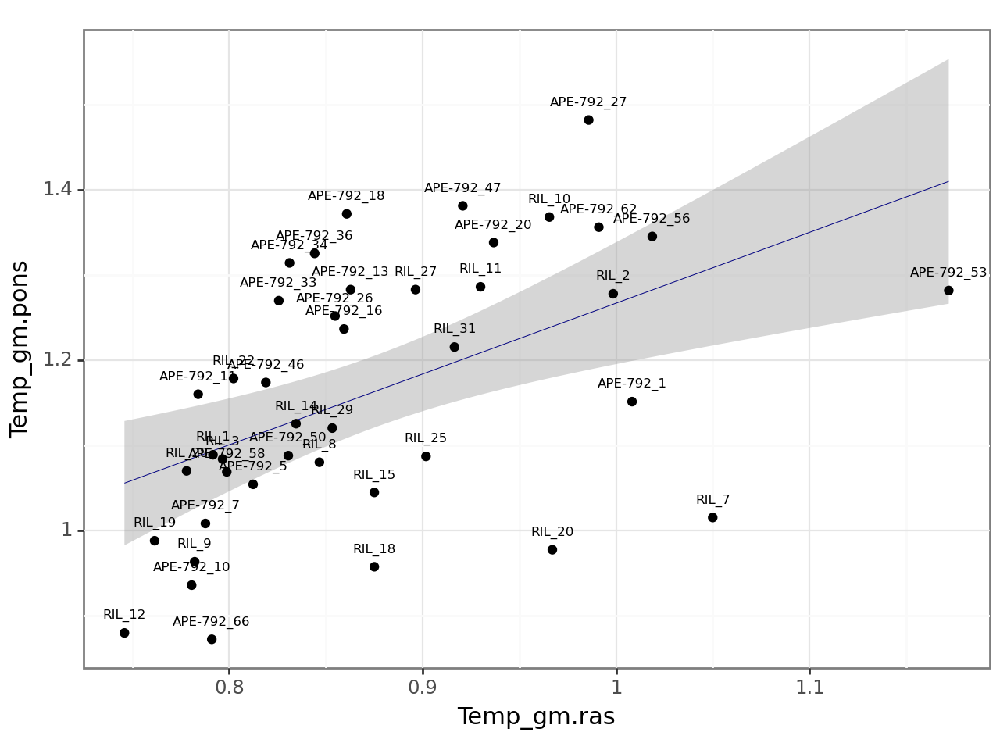


correlation for PostCing_gm is 0.6 with p-value of 0.0


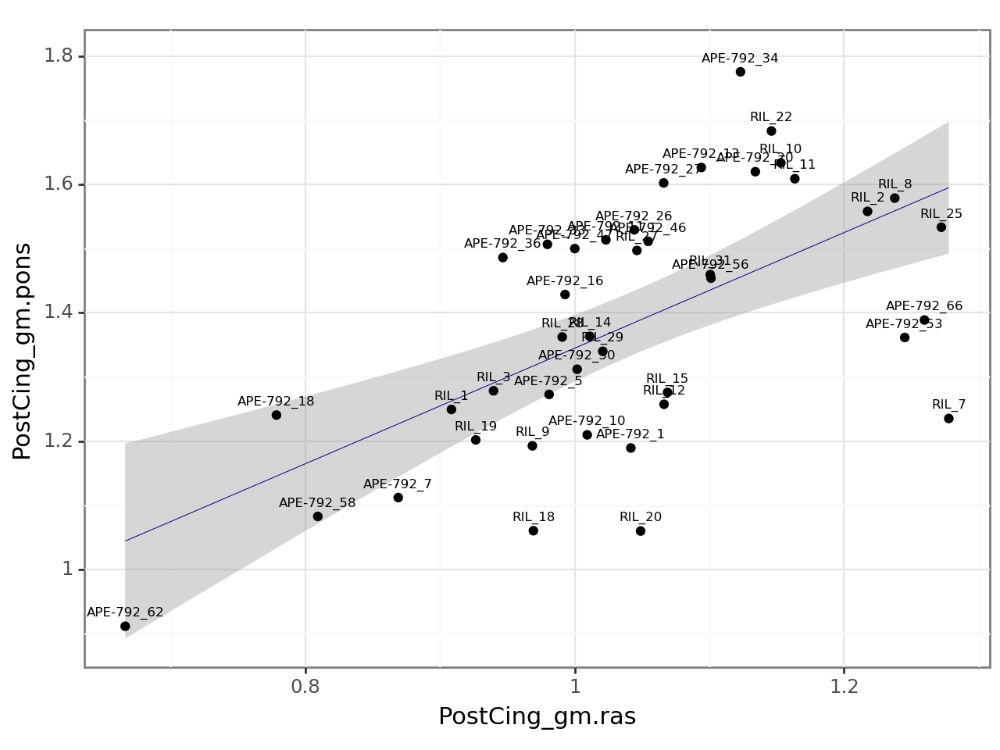

In [13]:
for var in [ele for ele in FDG_columns if (ele in ras.columns) & (ele in pons.columns)]:
    temp1 = ras.loc[ras['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp2 = pons.loc[pons['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp_combined = pd.merge(temp1, temp2, how = 'outer', on = ['ID_ADM'], suffixes=('.ras', '.pons'))
    temp_combined = temp_combined.dropna()
    stat, pval = scipy.stats.spearmanr(temp_combined[var +'.ras'], temp_combined[var +'.pons'])
    print('correlation for', var, 'is', stat.round(2), 'with p-value of', pval.round(4))    

    print(p9.ggplot(temp_combined, p9.aes(x = var +'.ras', y = var +'.pons', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02))

# new_para and ras (0.51-0.85 correlation)

correlation for MTL_gm is 0.82 with p-value of 0.0


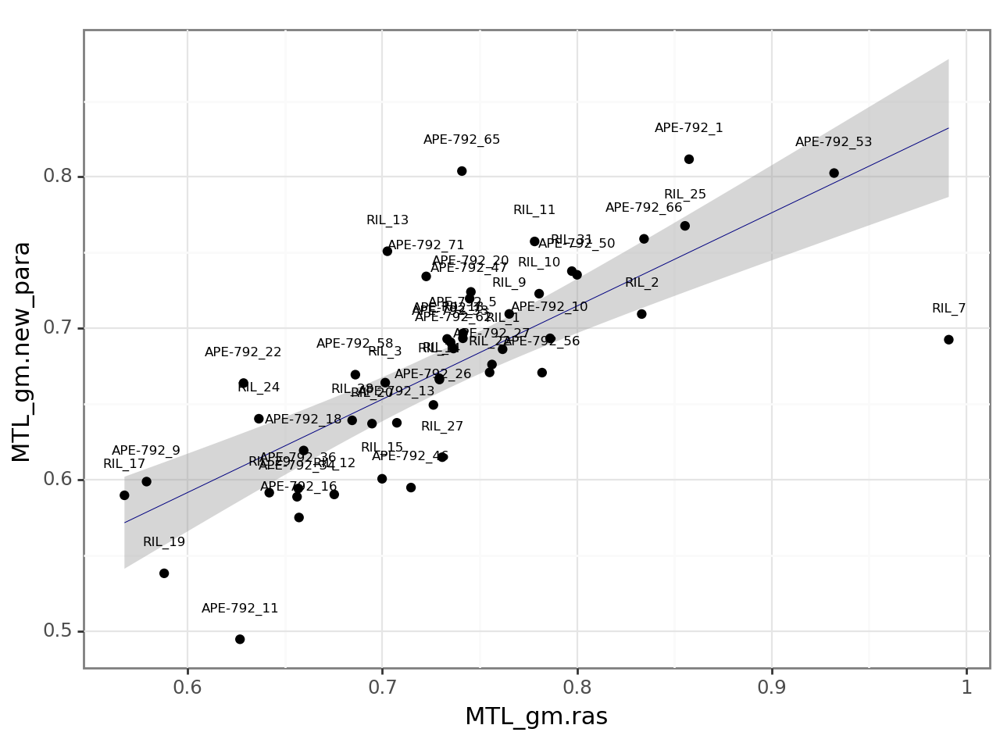


correlation for SensMot_gm is 0.51 with p-value of 0.0002


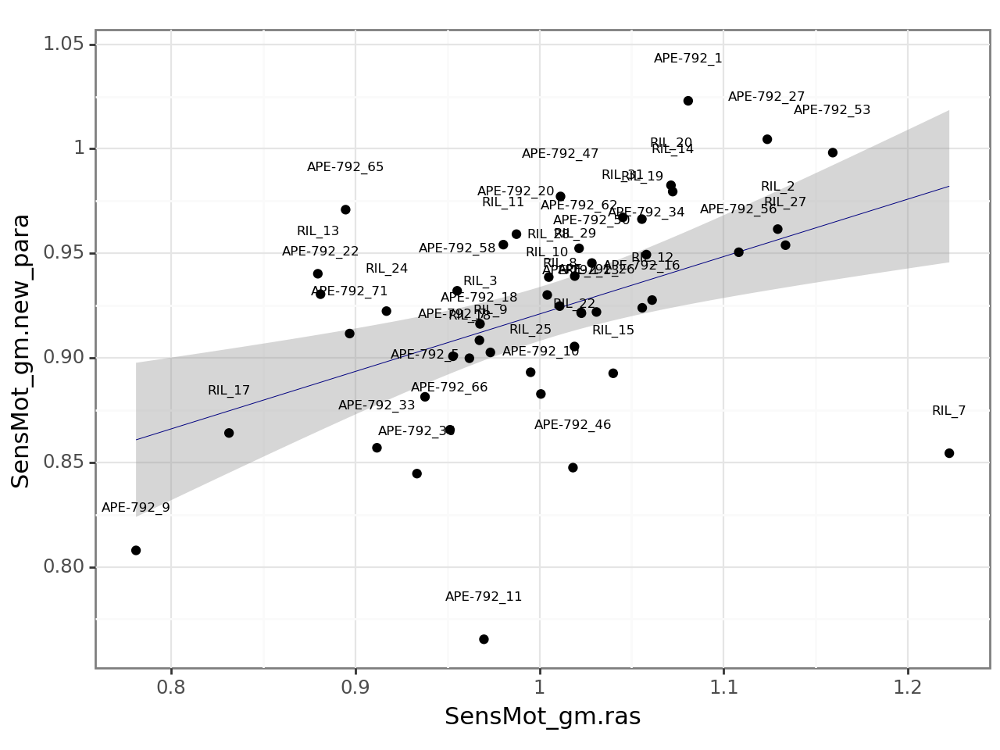


correlation for FRONTAL_gm is 0.68 with p-value of 0.0


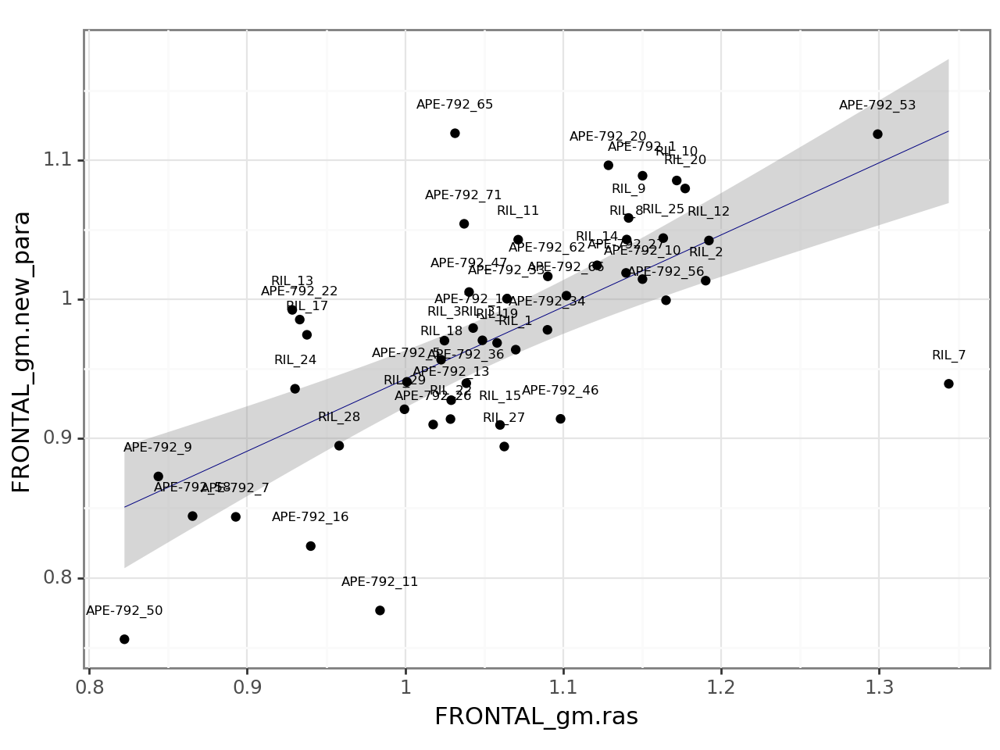


correlation for AC_gm is 0.81 with p-value of 0.0


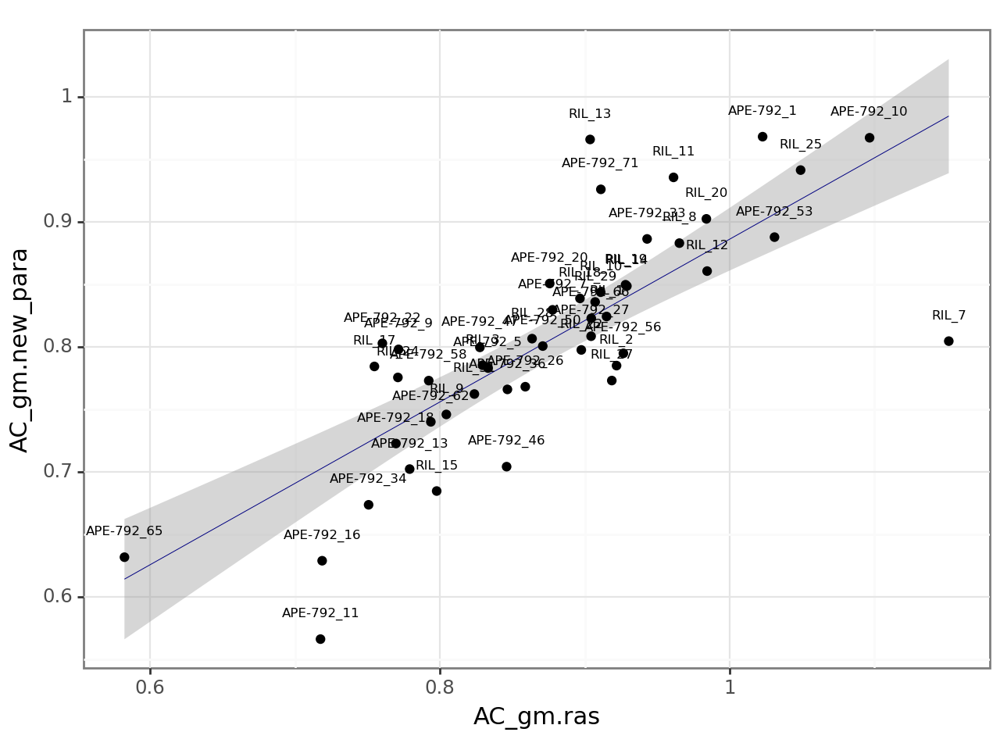


correlation for Precun_gm is 0.7 with p-value of 0.0


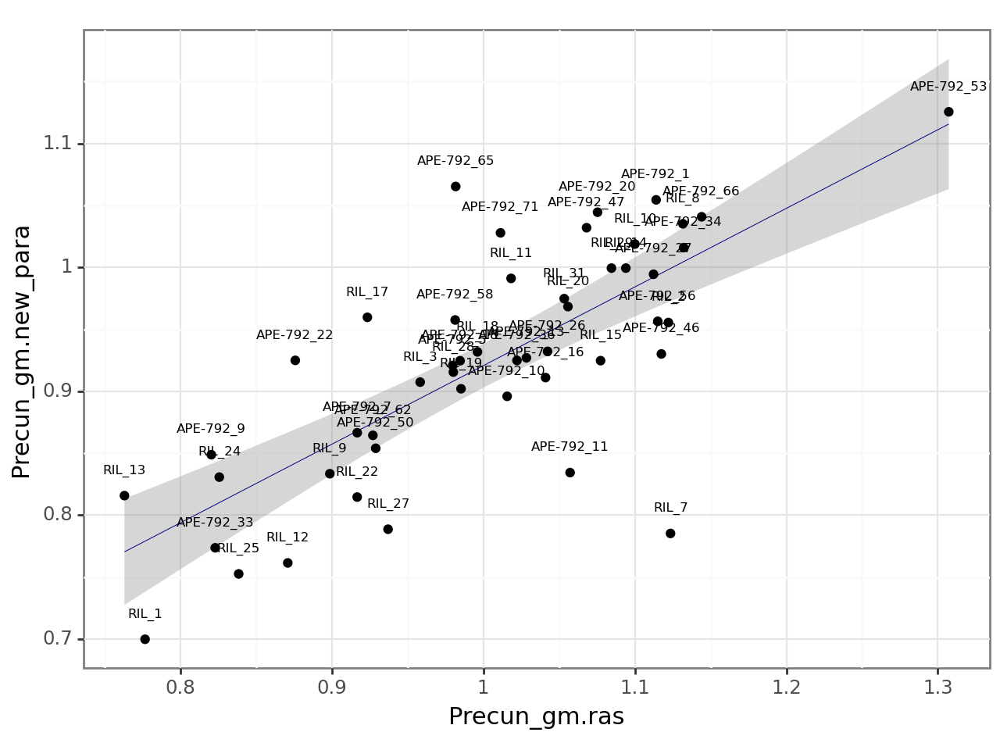


correlation for Par_gm is 0.85 with p-value of 0.0


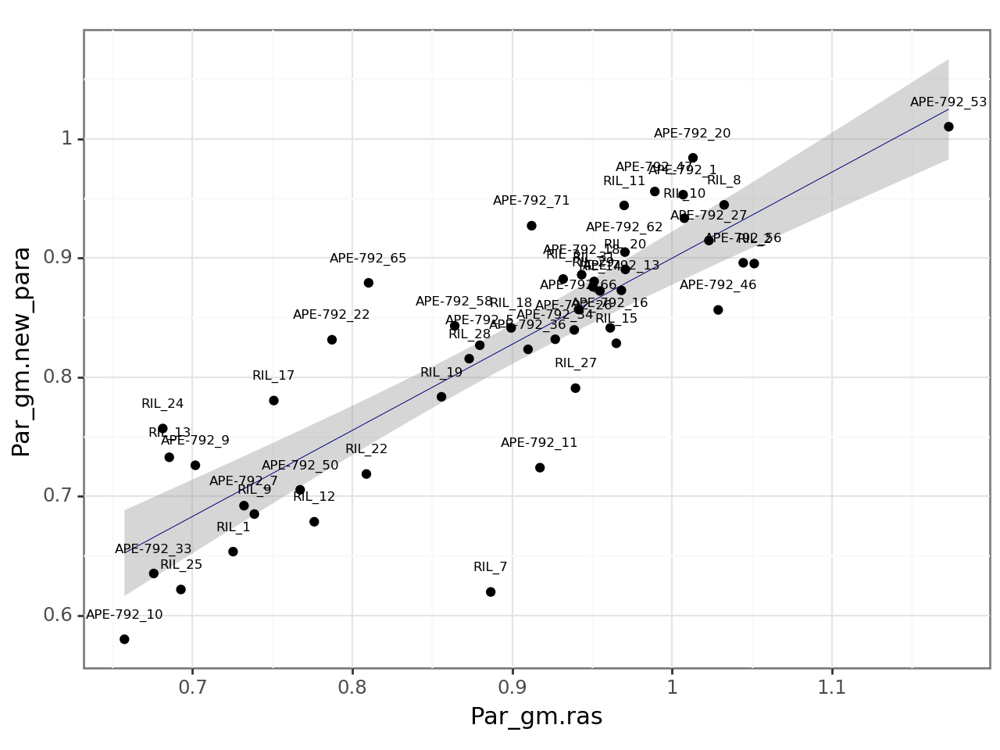


correlation for RASref1_gm is nan with p-value of nan


c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\plotnine\stats\stat_smooth.py:210: PlotnineWarning: Smoothing requires 2 or more points. Got 1. Not enough points for smoothing. If this message a surprise, make sure the column mapped to the x aesthetic has the right dtype.


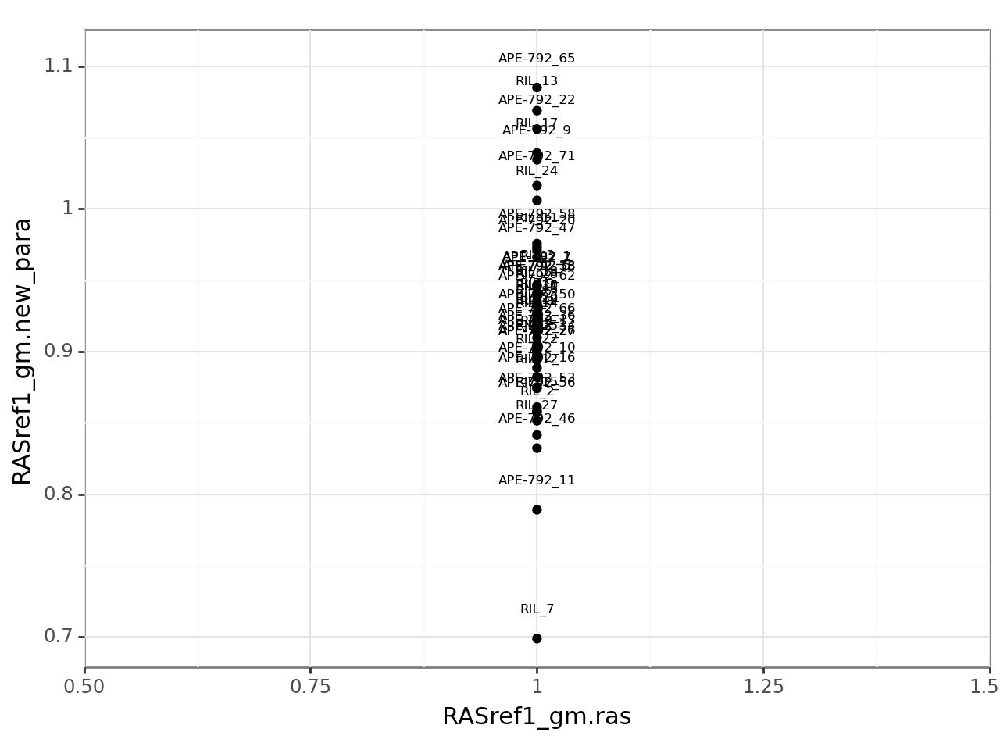


correlation for Temp_gm is 0.83 with p-value of 0.0


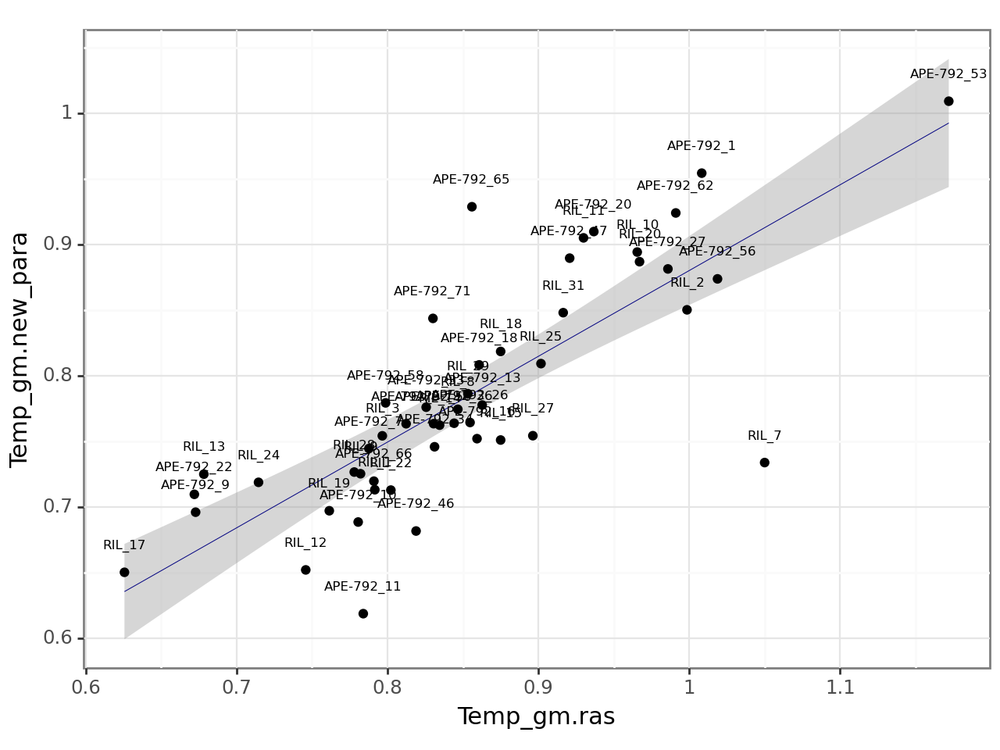


correlation for Paracentral_gm is nan with p-value of nan


c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.


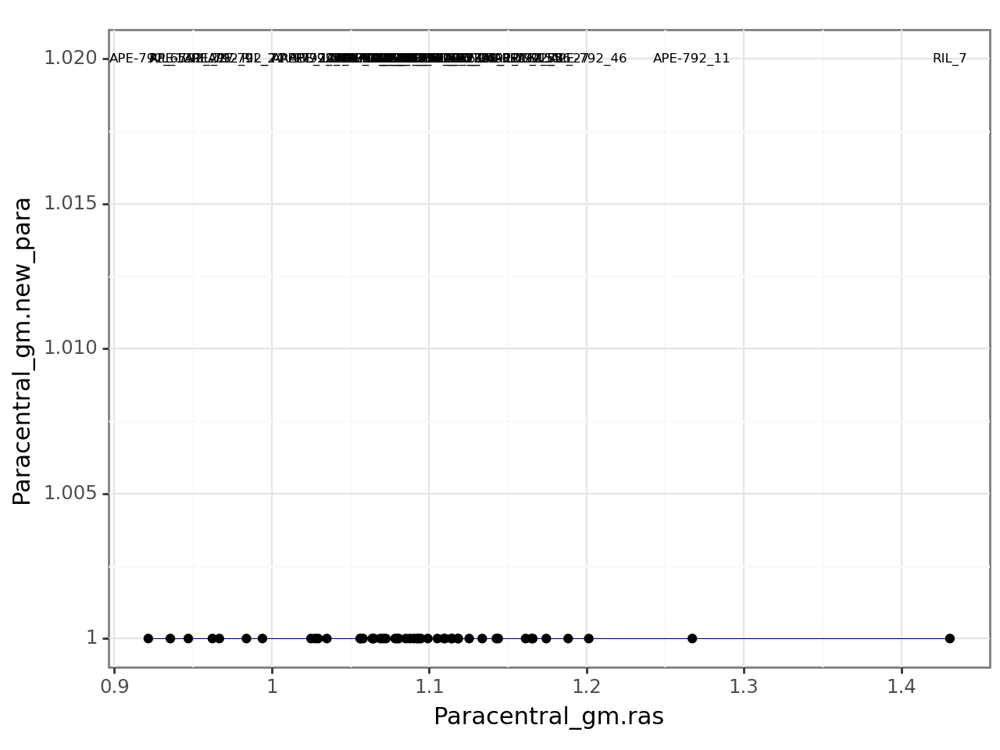


correlation for PostCing_gm is 0.8 with p-value of 0.0


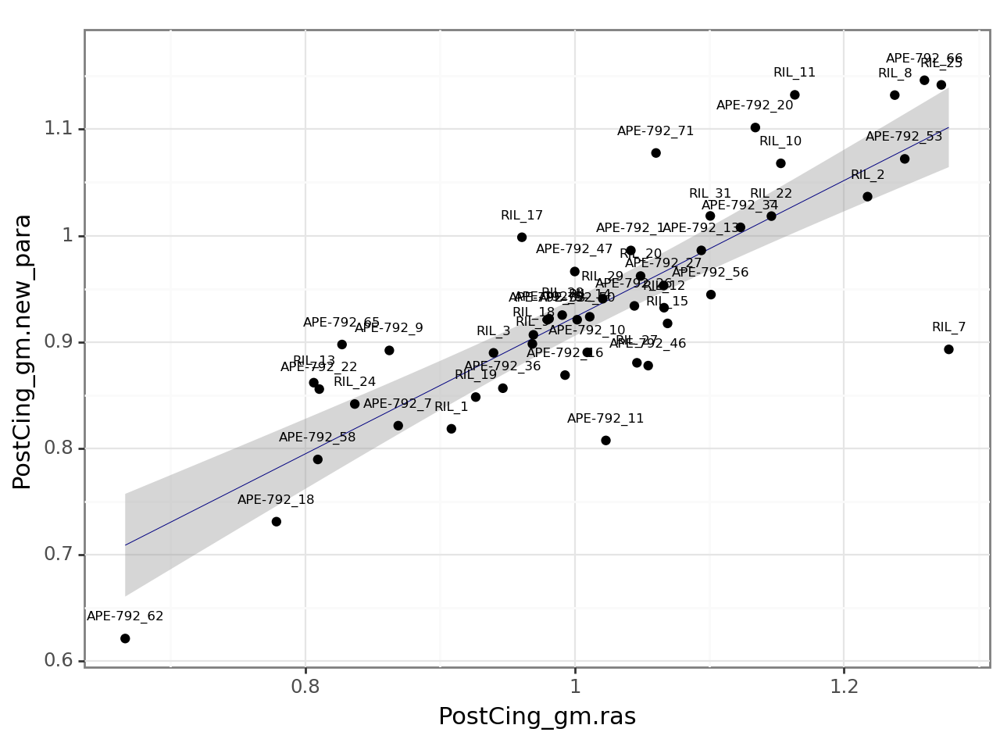

In [14]:
for var in [ele for ele in FDG_columns if (ele in ras.columns) & (ele in new_para.columns)]:
    temp1 = ras.loc[ras['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp2 = new_para.loc[new_para['timepoint'].isin(['base']), ['ID_ADM', var]]
    temp_combined = pd.merge(temp1, temp2, how = 'outer', on = ['ID_ADM'], suffixes=('.ras', '.new_para'))
    temp_combined = temp_combined.dropna()
    stat, pval = scipy.stats.spearmanr(temp_combined[var +'.ras'], temp_combined[var +'.new_para'])
    try:
      print('correlation for', var, 'is', stat.round(2), 'with p-value of', pval.round(4))    
    except:
      print('correlation for', var, 'is', stat, 'with p-value of', pval)    

    print(p9.ggplot(temp_combined, p9.aes(x = var +'.ras', y = var +'.new_para', label = 'ID_ADM'))
      + p9.theme_bw(base_size = 11)
      + p9.geom_smooth(method = 'lm', size = 0.2, color = 'navy')
      + p9.geom_point()
      + p9.geom_text(size = 6, nudge_x = 0, nudge_y =.02))